# Group Infomation:

**Team:** 02

**Team member:** Hou Bo, Tian Shulin, Wang Yaoxuan

**Topic:** Customer Personality Analysis

**Source:** https://www.kaggle.com/imakash3011/customer-personality-analysis

---

In [16]:
# Importing the Libraries

import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib as mpl
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
#pip install cufflinks
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=True, world_readable=True)

import warnings
warnings.filterwarnings('ignore')

In [17]:
# Loading the dataset
main_df = pd.read_csv('marketing_campaign.csv', delimiter = '\t')
custdata = main_df.copy()
custdata.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


---

# Data Preparation (Tian Shulin)

## 1. Data Cleaning

In [18]:
#Information on features 
custdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [19]:
custdata.isna().any()

ID                     False
Year_Birth             False
Education              False
Marital_Status         False
Income                  True
Kidhome                False
Teenhome               False
Dt_Customer            False
Recency                False
MntWines               False
MntFruits              False
MntMeatProducts        False
MntFishProducts        False
MntSweetProducts       False
MntGoldProds           False
NumDealsPurchases      False
NumWebPurchases        False
NumCatalogPurchases    False
NumStorePurchases      False
NumWebVisitsMonth      False
AcceptedCmp3           False
AcceptedCmp4           False
AcceptedCmp5           False
AcceptedCmp1           False
AcceptedCmp2           False
Complain               False
Z_CostContact          False
Z_Revenue              False
Response               False
dtype: bool

In [20]:
# Remove the NA values in income attribute
custdata = custdata.dropna()
custdata = custdata.dropna().reset_index(drop = True)
print("The total number of data-points after removing the rows with missing values are:", len(custdata))

The total number of data-points after removing the rows with missing values are: 2216


In [21]:
# Age of customers
import datetime
for i in range(2216):
    #transform Dt_customer to standard timestamp
    custdata['Dt_Customer'][i] = datetime.datetime.strptime(str(custdata['Dt_Customer'][i]), "%d-%m-%Y").strftime("%Y-%m-%d") 
    # access the YYYY of timestamp
    custdata['Dt_Customer'][i] = int(str(custdata['Dt_Customer'][i]).split('-')[0]) 
    
custdata["Age"] = custdata["Dt_Customer"] - custdata["Year_Birth"]
custdata["Age"] = custdata["Age"].astype(int)
custdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2216 entries, 0 to 2215
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2216 non-null   int64  
 1   Year_Birth           2216 non-null   int64  
 2   Education            2216 non-null   object 
 3   Marital_Status       2216 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2216 non-null   int64  
 6   Teenhome             2216 non-null   int64  
 7   Dt_Customer          2216 non-null   object 
 8   Recency              2216 non-null   int64  
 9   MntWines             2216 non-null   int64  
 10  MntFruits            2216 non-null   int64  
 11  MntMeatProducts      2216 non-null   int64  
 12  MntFishProducts      2216 non-null   int64  
 13  MntSweetProducts     2216 non-null   int64  
 14  MntGoldProds         2216 non-null   int64  
 15  NumDealsPurchases    2216 non-null   i

In [22]:
custdata.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,...,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.0,2216.0,2216.000000,2216.000000
mean,5588.353339,1968.820397,52247.251354,0.441787,0.505415,49.012635,305.091606,26.356047,166.995939,37.637635,...,0.073556,0.074007,0.073105,0.064079,0.013538,0.009477,3.0,11.0,0.150271,44.208032
std,3249.376275,11.985554,25173.076661,0.536896,0.544181,28.948352,337.327920,39.793917,224.283273,54.752082,...,0.261106,0.261842,0.260367,0.244950,0.115588,0.096907,0.0,0.0,0.357417,12.023812
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,16.000000
25%,2814.750000,1959.000000,35303.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,36.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,174.500000,8.000000,68.000000,12.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,43.000000
75%,8421.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,505.000000,33.000000,232.250000,50.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,54.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000,121.000000


**1. Age**

In [23]:
# Drop outliers of age by calculating Z-Score

from scipy import stats

custdata["z_value_age"] = np.abs(stats.zscore(custdata["Age"]))
custdata["z_value_age"]

0       0.897752
1       1.313688
2       0.315443
3       1.181925
4       0.932363
          ...   
2211    0.149069
2212    1.979184
2213    0.932363
2214    1.147313
2215    1.147313
Name: z_value_age, Length: 2216, dtype: float64

In [24]:
threshold = 3
z1  = np.abs(stats.zscore(custdata["Age"]))
np.where(z1>3)

(array([181, 228, 326], dtype=int64),)

In [25]:
custdata.iloc[np.where(z1>3)]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,z_value_age
181,7829,1900,2n Cycle,Divorced,36640.0,1,0,2013,99,15,...,0,0,0,0,1,3,11,0,113,5.722602
228,11004,1893,2n Cycle,Single,60182.0,0,1,2014,23,8,...,0,0,0,0,0,3,11,0,121,6.388099
326,1150,1899,PhD,Together,83532.0,0,0,2013,36,755,...,0,1,0,0,0,3,11,0,114,5.805789


In [26]:
# Remove rows with z_value_age > 3
custdata = custdata.drop(custdata[custdata.z_value_age > 3].index)

# Reset the index to [0:2212]
custdata = custdata.reset_index(drop=True)
custdata.shape

(2213, 31)

**2. Income**

In [27]:
# Drop outliers of income by calculating Z-Score
custdata["z_value_income"] = np.abs(stats.zscore(custdata["Income"]))
custdata["z_value_income"]

0       0.234435
1       0.234084
2       0.769733
3       1.016592
4       0.240593
          ...   
2208    0.356988
2209    0.467861
2210    0.188473
2211    0.675663
2212    0.025123
Name: z_value_income, Length: 2213, dtype: float64

In [28]:
threshold = 3
z2  = np.abs(stats.zscore(custdata["Income"]))
np.where(z2>3)

(array([ 153,  601,  639,  671, 1284, 1633, 2106, 2206], dtype=int64),)

In [29]:
custdata.iloc[np.where(z2>3)]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,z_value_age,z_value_income
153,8475,1973,PhD,Married,157243.0,0,1,2014,98,20,...,0,0,0,0,3,11,0,41,0.266867,4.171405
601,1503,1976,PhD,Together,162397.0,1,1,2013,31,85,...,0,0,0,0,3,11,0,37,0.599615,4.376149
639,5555,1975,Graduation,Divorced,153924.0,0,0,2014,81,1,...,0,0,0,0,3,11,0,39,0.433241,4.039557
671,1501,1982,PhD,Married,160803.0,0,0,2012,21,55,...,0,0,0,0,3,11,0,30,1.181925,4.312827
1284,5336,1971,Master,Together,157733.0,1,0,2013,37,39,...,0,0,0,0,3,11,0,42,0.183680,4.190870
1633,4931,1977,Graduation,Together,157146.0,0,0,2013,13,1,...,0,0,0,0,3,11,0,36,0.682802,4.167552
2106,11181,1949,PhD,Married,156924.0,0,0,2013,85,2,...,0,0,0,0,3,11,0,64,1.646436,4.158733
2206,9432,1977,Graduation,Together,666666.0,1,0,2013,23,9,...,0,0,0,0,3,11,0,36,0.682802,24.408355


Clearly, the income of 150k~160k is customers with very high income, however, there is one customer whose income is 666666.0 should be an outlier.

In [30]:
# Remove rows with z_value_age > 5
custdata = custdata.drop(custdata[custdata.z_value_income > 5].index)

# Reset the index to [0:2212]
custdata = custdata.reset_index(drop=True)
custdata.shape

(2212, 32)

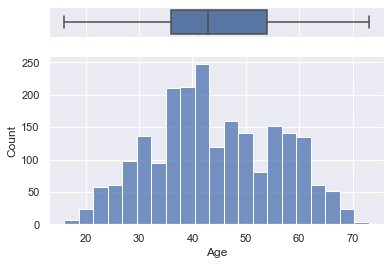

In [31]:
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above) 
sb.set(style="darkgrid")
 
# creating a figure composed of two matplotlib.Axes objects (ax_box and ax_hist)
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)},)
 
# assigning a graph to each ax
sb.boxplot(custdata["Age"], ax=ax_box)
sb.histplot(data=custdata, x="Age", ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')
plt.show()

In [32]:
# Checking for correlation by unstacking data

corr = custdata.corr()
c1 = corr.abs().unstack()
c1.sort_values(ascending = False)[24:50:2]

Income             Income                 1.000000
z_value_income     z_value_income         1.000000
Age                Year_Birth             0.998292
MntMeatProducts    NumCatalogPurchases    0.733787
Income             NumCatalogPurchases    0.696589
                   MntMeatProducts        0.692279
MntWines           Income                 0.688209
Income             NumWebVisitsMonth      0.650257
MntWines           NumStorePurchases      0.640219
                   NumCatalogPurchases    0.634237
NumStorePurchases  Income                 0.631424
MntFishProducts    MntFruits              0.593038
MntSweetProducts   MntFishProducts        0.583484
dtype: float64

## 2. Feature Engineering

In [33]:
#Total spendings on various items
custdata["Spent"] = custdata["MntWines"]+ custdata["MntFruits"]+ custdata["MntMeatProducts"]+ custdata["MntFishProducts"]+ custdata["MntSweetProducts"]+ custdata["MntGoldProds"]

#Deriving living situation by marital status"Alone"
custdata["Living_With"]=custdata["Marital_Status"].replace({"Married":"Partner", "Together":"Partner", "Absurd":"Alone", "Widow":"Alone", "YOLO":"Alone", "Divorced":"Alone", "Single":"Alone",})

#Feature indicating total children living in the household
custdata["Children"]=custdata["Kidhome"]+custdata["Teenhome"]

#Feature for total members in the householde
custdata["Family_Size"] = custdata["Living_With"].replace({"Alone": 1, "Partner":2})+ custdata["Children"]

#Feature pertaining parenthood
custdata["Is_Parent"] = np.where(custdata.Children> 0, 1, 0)

#Segmenting education levels in three groups
custdata["Education"]=custdata["Education"].replace({"Basic":"Undergraduate","2n Cycle":"Undergraduate", "Graduation":"Graduate", "Master":"Postgraduate", "PhD":"Postgraduate"})

#Dropping some of the redundant features
to_drop = ["ID", "Year_Birth", "Marital_Status", "Dt_Customer", "Z_CostContact", "Z_Revenue", "z_value_age", "z_value_income"]
custdata = custdata.drop(to_drop, axis=1)

In [34]:
custdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2212 entries, 0 to 2211
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Education            2212 non-null   object 
 1   Income               2212 non-null   float64
 2   Kidhome              2212 non-null   int64  
 3   Teenhome             2212 non-null   int64  
 4   Recency              2212 non-null   int64  
 5   MntWines             2212 non-null   int64  
 6   MntFruits            2212 non-null   int64  
 7   MntMeatProducts      2212 non-null   int64  
 8   MntFishProducts      2212 non-null   int64  
 9   MntSweetProducts     2212 non-null   int64  
 10  MntGoldProds         2212 non-null   int64  
 11  NumDealsPurchases    2212 non-null   int64  
 12  NumWebPurchases      2212 non-null   int64  
 13  NumCatalogPurchases  2212 non-null   int64  
 14  NumStorePurchases    2212 non-null   int64  
 15  NumWebVisitsMonth    2212 non-null   i

---

# EDA && Visualization

### 1) Box-Plot + Histogram + Density (Tian Shulin)

In [35]:
custdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2212 entries, 0 to 2211
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Education            2212 non-null   object 
 1   Income               2212 non-null   float64
 2   Kidhome              2212 non-null   int64  
 3   Teenhome             2212 non-null   int64  
 4   Recency              2212 non-null   int64  
 5   MntWines             2212 non-null   int64  
 6   MntFruits            2212 non-null   int64  
 7   MntMeatProducts      2212 non-null   int64  
 8   MntFishProducts      2212 non-null   int64  
 9   MntSweetProducts     2212 non-null   int64  
 10  MntGoldProds         2212 non-null   int64  
 11  NumDealsPurchases    2212 non-null   int64  
 12  NumWebPurchases      2212 non-null   int64  
 13  NumCatalogPurchases  2212 non-null   int64  
 14  NumStorePurchases    2212 non-null   int64  
 15  NumWebVisitsMonth    2212 non-null   i

In [36]:
numeric_data = pd.DataFrame(custdata[["Age","Income", "Children", "Family_Size", "MntWines", "MntFruits","MntMeatProducts", 'MntFishProducts',
            'MntSweetProducts', 'MntGoldProds',"Spent", 'NumDealsPurchases','NumWebPurchases']])

In [37]:
numeric_data.describe().round(2)

,Age,Income,Children,Family_Size,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Spent,NumDealsPurchases,NumWebPurchases
count,2212.00,2212.00,2212.00,2212.00,2212.00,2212.00,2212.00,2212.00,2212.00,2212.00,2212.00,2212.00,2212.00
mean,44.11,51958.81,0.95,2.59,305.29,26.33,167.03,37.65,27.05,43.93,607.27,2.32,4.09
std,11.74,21527.28,0.75,0.91,337.32,39.74,224.25,54.77,41.09,51.71,602.51,1.92,2.74
min,16.00,1730.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,0.00,0.00
25%,36.00,35233.50,0.00,2.00,24.00,2.00,16.00,3.00,1.00,9.00,69.00,1.00,2.00
50%,43.00,51371.00,1.00,3.00,175.50,8.00,68.00,12.00,8.00,24.50,397.00,2.00,4.00
75%,54.00,68487.00,1.00,3.00,505.00,33.00,232.25,50.00,33.00,56.00,1048.00,3.00,6.00
max,73.00,162397.00,3.00,5.00,1493.00,199.00,1725.00,259.00,262.00,321.00,2525.00,15.00,27.00


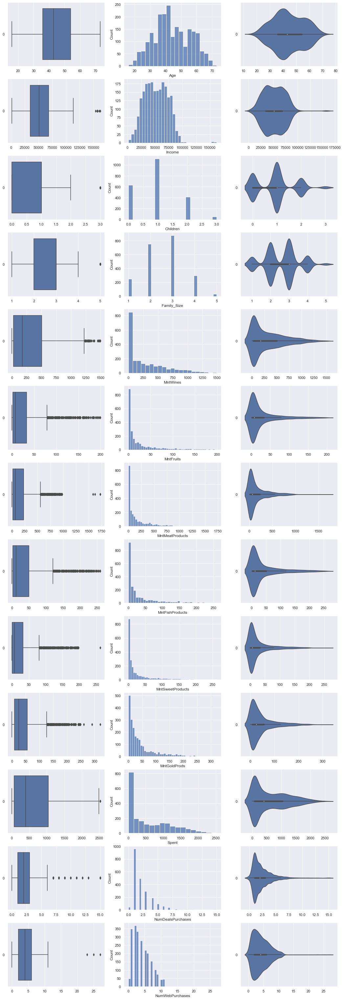

In [38]:
# Draw the distributions of all variables
f, axes = plt.subplots(13, 3, figsize=(18, 55))

count = 0
for var in numeric_data:
    sb.boxplot(data = numeric_data[var], orient = "h", ax = axes[count,0])
    sb.histplot(data = numeric_data[var], ax = axes[count,1])
    sb.violinplot(data = numeric_data[var], orient = "h", ax = axes[count,2])
    count += 1

### 2) HeatMap (Tian Shulin)

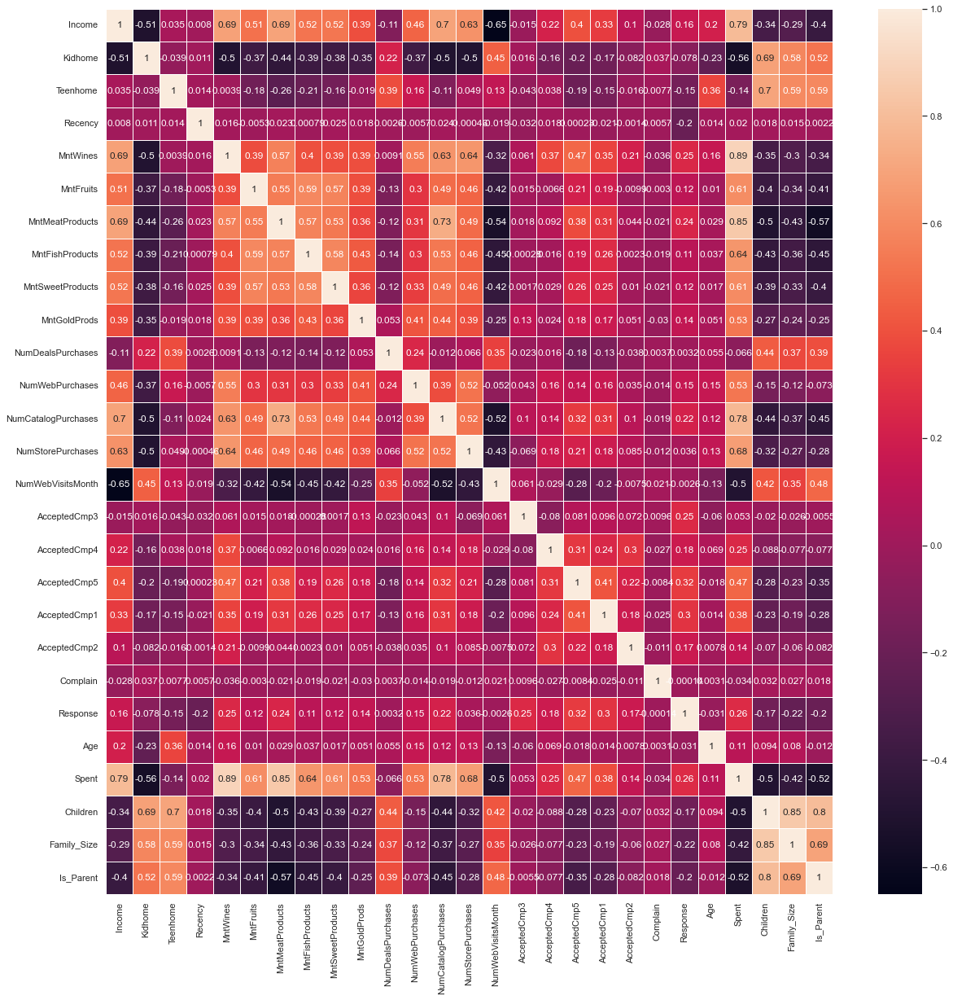

In [39]:
# Finding the correlation between the feature column

plt.figure(figsize=(20,20))
sb.heatmap(custdata.corr(), annot=True,linewidths=.5)

plt.show()

<AxesSubplot:>

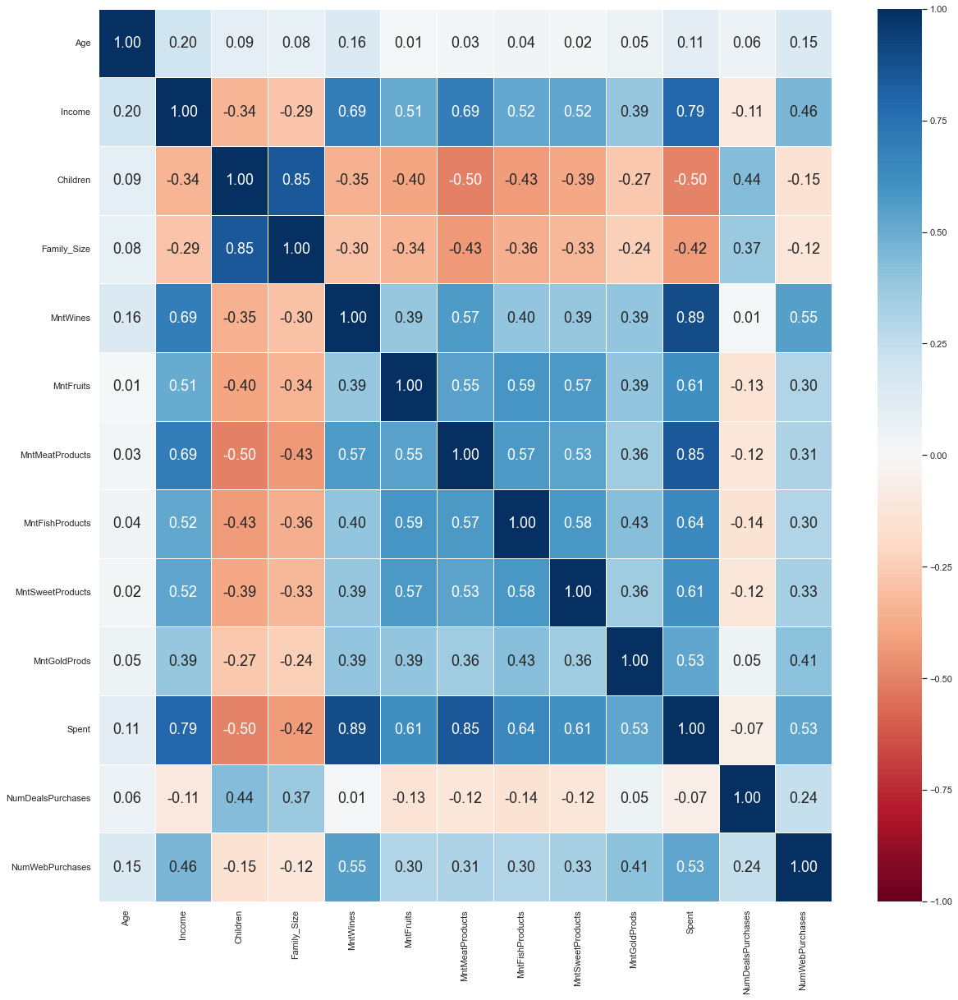

In [40]:
plt.figure(figsize=(20,20))
sb.heatmap(numeric_data.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

In [41]:
# Checking for correlation by unstacking data

corr = custdata.corr()
c1 = corr.abs().unstack()
c1.sort_values(ascending = False)[24:50:2]

Teenhome             Teenhome               1.000000
Is_Parent            Is_Parent              1.000000
Spent                MntWines               0.892996
Family_Size          Children               0.849574
MntMeatProducts      Spent                  0.845543
Children             Is_Parent              0.799802
Spent                Income                 0.792740
NumCatalogPurchases  Spent                  0.780250
MntMeatProducts      NumCatalogPurchases    0.733787
Teenhome             Children               0.698199
NumCatalogPurchases  Income                 0.696589
Family_Size          Is_Parent              0.692370
MntMeatProducts      Income                 0.692279
dtype: float64

### 3) Categoric Distribution (Hou Bo)

In [42]:
custdata.head()

,Education,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,Graduate,58138.0,0,0,58,635,88,546,172,88,...,0,0,0,1,55,1617,Alone,0,1,0
1,Graduate,46344.0,1,1,38,11,1,6,2,1,...,0,0,0,0,60,27,Alone,2,3,1
2,Graduate,71613.0,0,0,26,426,49,127,111,21,...,0,0,0,0,48,776,Partner,0,2,0
3,Graduate,26646.0,1,0,26,11,4,20,10,3,...,0,0,0,0,30,53,Partner,1,3,1
4,Postgraduate,58293.0,1,0,94,173,43,118,46,27,...,0,0,0,0,33,422,Partner,1,3,1


In [43]:
catData1 = pd.DataFrame(custdata[['Living_With', 'Education']])
catData1.head()

,Living_With,Education
0,Alone,Graduate
1,Alone,Graduate
2,Partner,Graduate
3,Partner,Graduate
4,Partner,Postgraduate


In [44]:
catData2 = pd.DataFrame(custdata[['Kidhome', 'Teenhome','Children']])
catData2.head()

,Kidhome,Teenhome,Children
0,0,0,0
1,1,1,2
2,0,0,0
3,1,0,1
4,1,0,1


Data used to draw categorical plots:

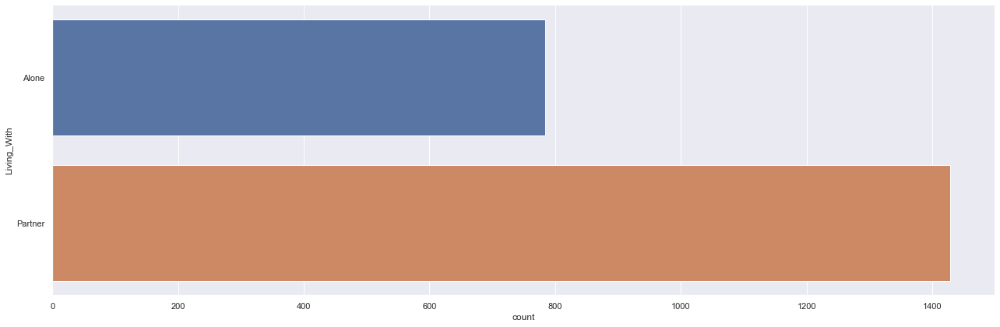

In [45]:
sb.catplot(y = 'Living_With', data = catData1, kind = "count", height = 6, aspect= 3)

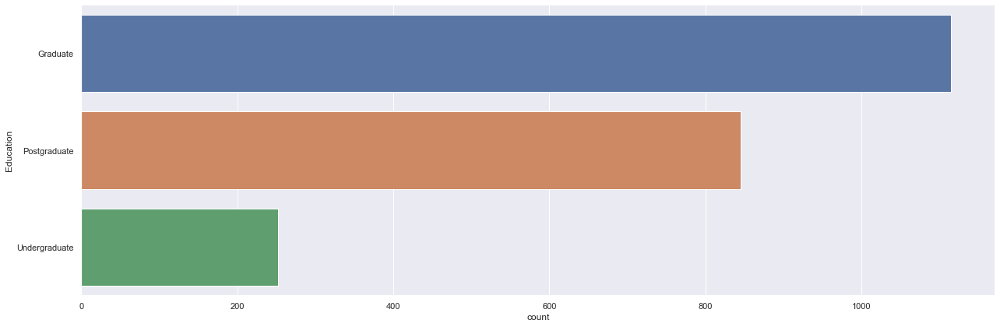

In [46]:
sb.catplot(y = 'Education', data = catData1, kind = "count", height = 6, aspect= 3)

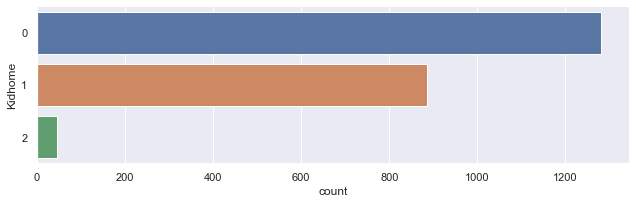

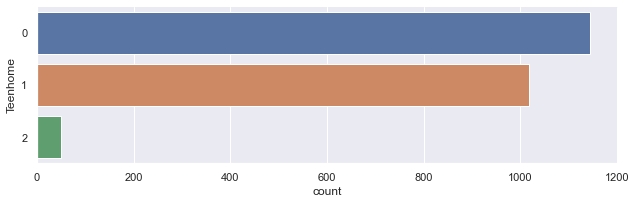

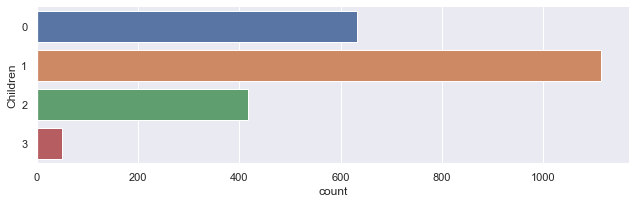

In [47]:
sb.catplot(y = 'Kidhome', data = catData2, kind = "count", height = 3, aspect= 3)
sb.catplot(y = 'Teenhome', data = catData2, kind = "count", height = 3, aspect= 3)
sb.catplot(y = 'Children' , data = catData2, kind = "count", height = 3, aspect= 3)

### 4) Distribution Plot (Wang Yaoxuan)

<AxesSubplot:ylabel='Density'>

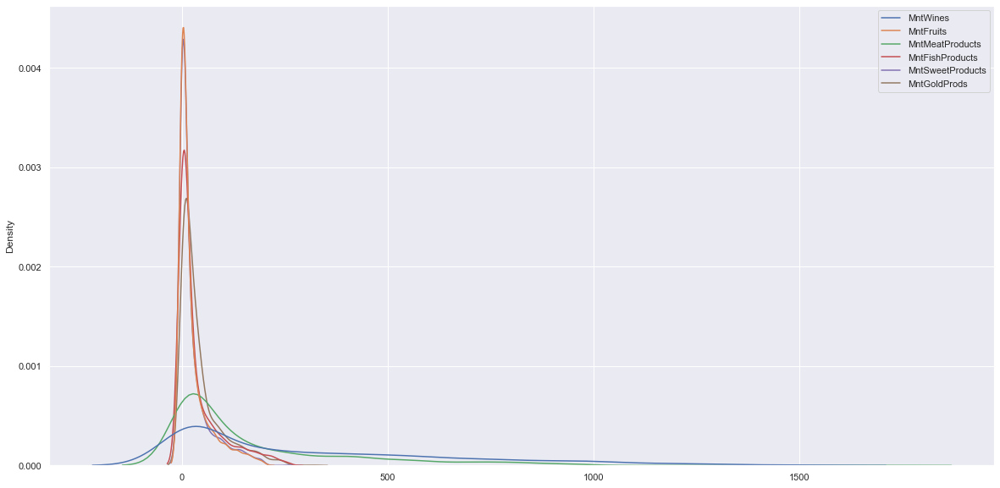

In [48]:
# Distribution plot for MntProduct
MntProduct_data = pd.DataFrame(custdata[["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"]])

f = plt.subplots(figsize=(20, 10))
sb.kdeplot(data = MntProduct_data)

<AxesSubplot:ylabel='Density'>

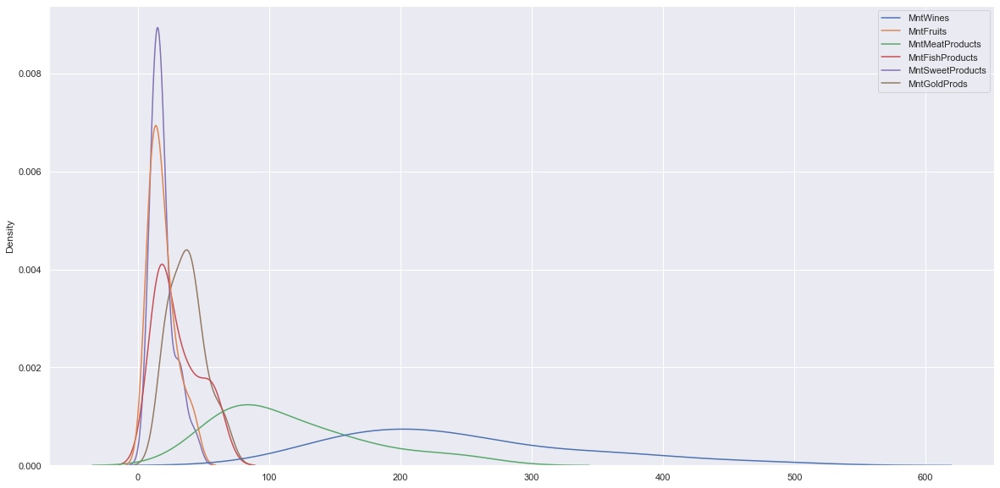

In [49]:
# remove outliers => zoom in?
from scipy.stats import zscore
z_scores = zscore(MntProduct_data)
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 0.5).all(axis = 1)
new_MntProduct_data = MntProduct_data[filtered_entries]
f = plt.subplots(figsize=(20, 10))
sb.kdeplot(data = new_MntProduct_data)

<AxesSubplot:ylabel='Density'>

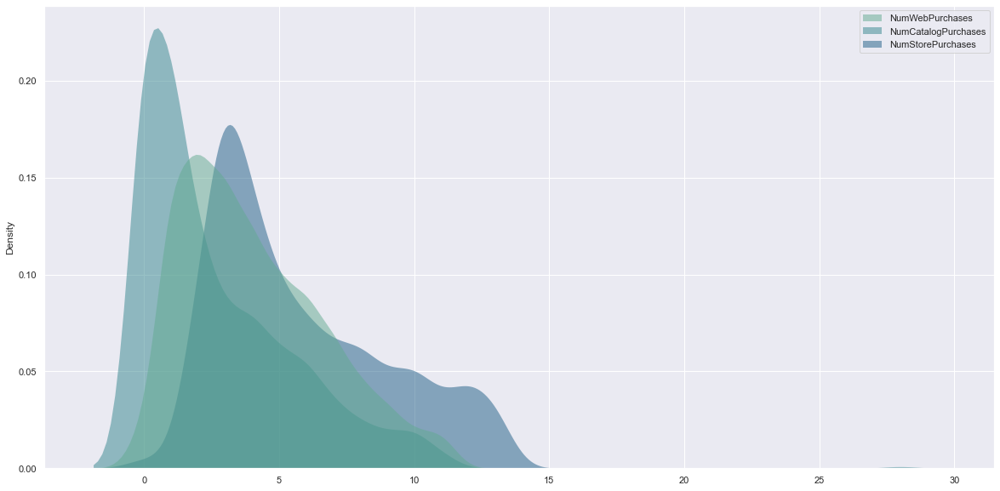

In [50]:
# Distribution plot for purchasing places
NumPurchasePlace_data = pd.DataFrame(custdata[["NumWebPurchases","NumCatalogPurchases","NumStorePurchases"]])
f = plt.subplots(figsize=(20, 10))
sb.kdeplot(data = NumPurchasePlace_data, fill=True, common_norm=False, palette="crest",
   alpha=.5, linewidth=0)

For most customers, they bought products more often in stores

<AxesSubplot:xlabel='NumDealsPurchases', ylabel='Count'>

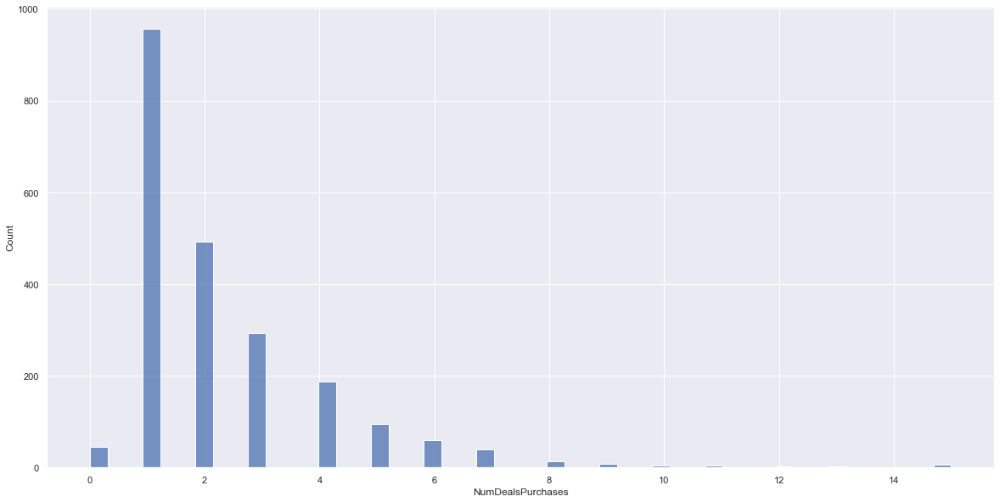

In [51]:
# Distribution plot for Number of Purchases with a discount
f = plt.subplots(figsize=(20, 10))
sb.histplot(data = custdata['NumDealsPurchases'])

Most customers only had 1 purchase with a discount

<AxesSubplot:xlabel='NumDealsPurchases', ylabel='Income'>

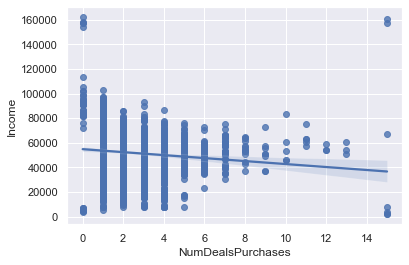

In [52]:
# Tried finding correlation between income and NumDealsPurchases...
Discount_Income = pd.DataFrame(custdata[["NumDealsPurchases","Income"]])
sb.regplot(y=Discount_Income["Income"], x=Discount_Income["NumDealsPurchases"])

<AxesSubplot:xlabel='Income', ylabel='Spent'>

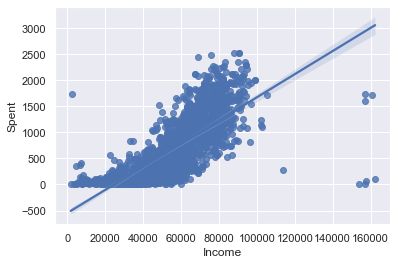

In [53]:
# Tried finding correlation between income and total spent...
Spent_Income = pd.DataFrame(custdata[["Spent","Income"]])
sb.regplot(y=Spent_Income["Spent"], x=Spent_Income["Income"])

We can infer that income and NumDealsPurchases do not have strong correlation while income and total spent have strong positive correlation. People with higher income tend to spend more.

---

# Clustering with Different Machine Learning Methods

## 1. KMeans++ (Hou Bo)

In [54]:
custdata.head()

,Education,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,Graduate,58138.0,0,0,58,635,88,546,172,88,...,0,0,0,1,55,1617,Alone,0,1,0
1,Graduate,46344.0,1,1,38,11,1,6,2,1,...,0,0,0,0,60,27,Alone,2,3,1
2,Graduate,71613.0,0,0,26,426,49,127,111,21,...,0,0,0,0,48,776,Partner,0,2,0
3,Graduate,26646.0,1,0,26,11,4,20,10,3,...,0,0,0,0,30,53,Partner,1,3,1
4,Postgraduate,58293.0,1,0,94,173,43,118,46,27,...,0,0,0,0,33,422,Partner,1,3,1


In [55]:
#Process categorical data
from sklearn.preprocessing import LabelEncoder
clusteringVarData = pd.DataFrame(custdata[["Age","Income", "Spent", "MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds", "Children", "Living_With", "Education", "Family_Size"]])
clusteringVarData_origin = clusteringVarData.copy()
clusteringCateVar = ['Education','Living_With']
clusteringCatData = pd.DataFrame(custdata[clusteringCateVar])
lbl_encode = LabelEncoder()
for i in clusteringCateVar:
    clusteringVarData[i]=clusteringVarData[[i]].apply(lbl_encode.fit_transform)
clusteringVarData.head(n=10)

,Age,Income,Spent,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Children,Living_With,Education,Family_Size
0,55,58138.0,1617,635,88,546,172,88,88,0,0,0,1
1,60,46344.0,27,11,1,6,2,1,6,2,0,0,3
2,48,71613.0,776,426,49,127,111,21,42,0,1,0,2
3,30,26646.0,53,11,4,20,10,3,5,1,1,0,3
4,33,58293.0,422,173,43,118,46,27,15,1,1,1,3
5,46,62513.0,716,520,42,98,0,42,14,1,1,1,3
6,41,55635.0,590,235,65,164,50,49,27,1,0,0,2
7,28,33454.0,169,76,10,56,3,1,23,1,1,1,3
8,39,30351.0,46,14,0,24,3,3,2,1,1,1,3
9,64,5648.0,49,28,0,6,1,1,13,2,1,1,4


In [56]:
#Standardization (since the numeric data differs a lot)
from sklearn.preprocessing import StandardScaler
clusteringVarData1 = clusteringVarData.copy()
scaled_features = StandardScaler().fit_transform(clusteringVarData1.values)
scaled_features_df = pd.DataFrame(scaled_features, index=clusteringVarData1.index, columns=clusteringVarData1.columns)
scaled_features_df.head()

,Age,Income,Spent,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Children,Living_With,Education,Family_Size
0,0.927582,0.287105,1.676245,0.977660,1.552041,1.690293,2.453472,1.483713,0.852576,-1.264598,-1.349603,-0.893586,-1.758359
1,1.353640,-0.260882,-0.963297,-0.872618,-0.637461,-0.718230,-0.651004,-0.634019,-0.733642,1.404572,-1.349603,-0.893586,0.449070
2,0.331100,0.913196,0.280110,0.357935,0.570540,-0.178542,1.339513,-0.147184,-0.037254,-1.264598,0.740959,-0.893586,-0.654644
3,-1.202709,-1.176114,-0.920135,-0.872618,-0.561961,-0.655787,-0.504911,-0.585335,-0.752987,0.069987,0.740959,-0.893586,0.449070
4,-0.947074,0.294307,-0.307562,-0.392257,0.419540,-0.218684,0.152508,-0.001133,-0.559545,0.069987,0.740959,0.571657,0.449070


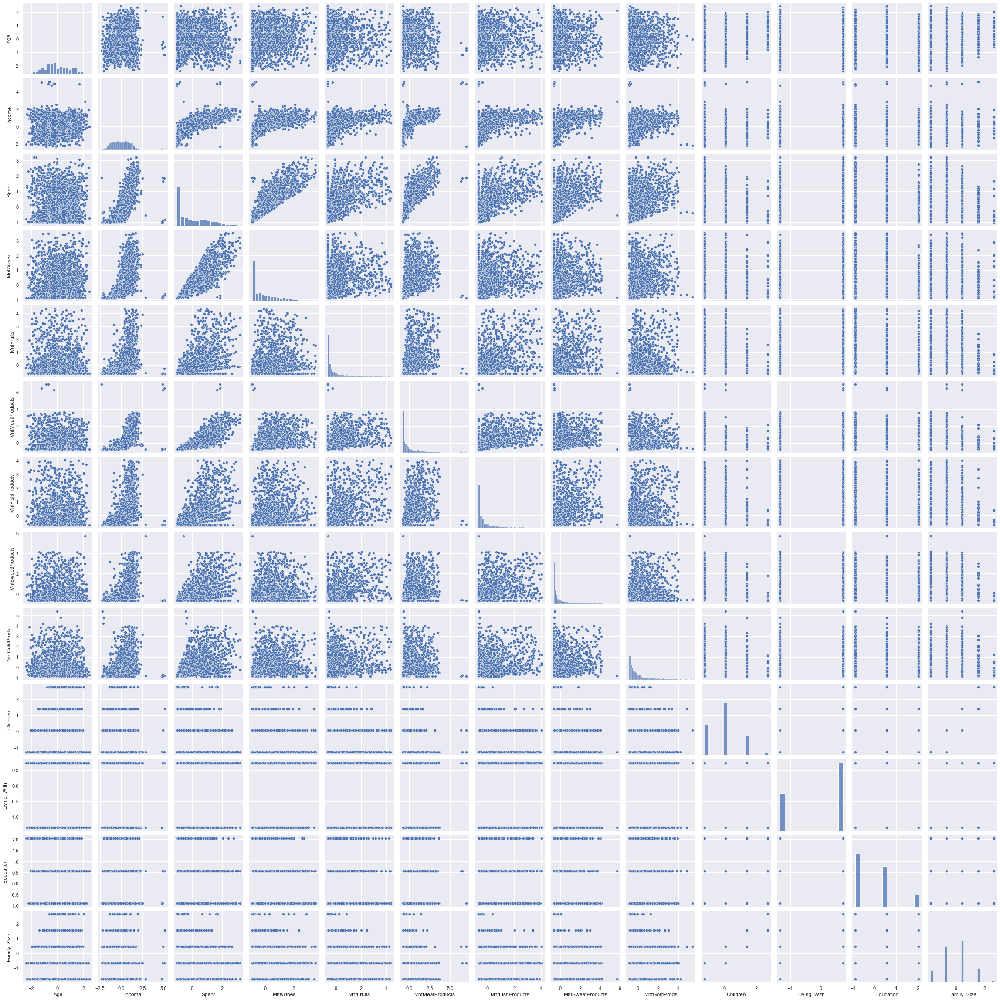

In [57]:
# Extract the Features from the Data
X = pd.DataFrame(scaled_features_df[["Age","Income", "Spent", "MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds", "Children", "Living_With", "Education", "Family_Size"]]) 

# Plot the Raw Data on 2D grids
sb.pairplot(X)

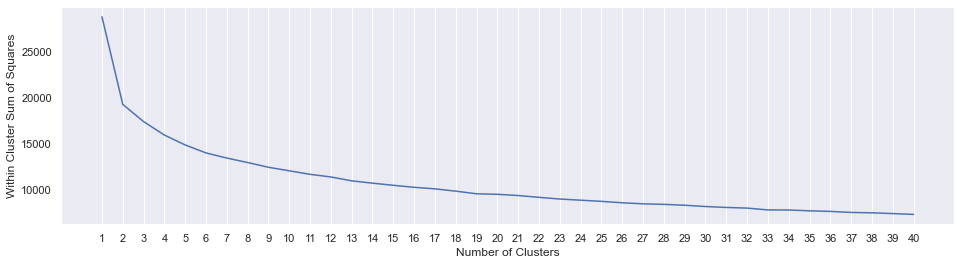

In [58]:
# Vary the Number of Clusters
from sklearn.cluster import KMeans

min_clust = 1
max_clust = 40
init_algo = 'k-means++'

# Compute Within Cluster Sum of Squares
within_ss = []
for num_clust in range(min_clust, max_clust+1):
    kmeans = KMeans(n_clusters = num_clust, init = init_algo, n_init = 5)
    kmeans.fit(X)
    within_ss.append(kmeans.inertia_)

# Angle Plot : Within SS vs Number of Clusters
f, axes = plt.subplots(1, 1, figsize=(16,4))
plt.plot(range(min_clust, max_clust+1), within_ss)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster Sum of Squares')
plt.xticks(np.arange(min_clust, max_clust+1, 1.0))
plt.grid(which='major', axis='y')
plt.show()

After analyzing the elbow plot，we choose to have 4 clusters for the following analysis.

In [59]:
# Import essential models from sklearn
from sklearn.cluster import KMeans

# Set "optimal" Clustering Parameters
num_clust = 4
init_algo = 'k-means++'

# Create Clustering Model using KMeans
kmeans = KMeans(n_clusters = num_clust, init = init_algo, n_init = 20)                 

# Fit the Clustering Model on the Data
kmeans.fit(X)

KMeans(n_clusters=4, n_init=20)

<AxesSubplot:xlabel='Cluster', ylabel='count'>

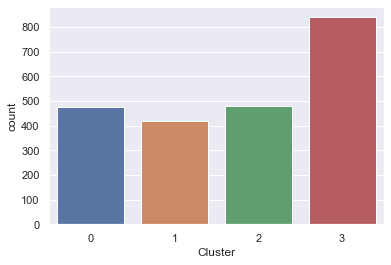

In [60]:
# Predict the Cluster Labels
labels = kmeans.predict(X)

# Append Labels to the Data
X_labeled_KM = X.copy()
X_labeled_KM["Cluster"] = pd.Categorical(labels)

# Summary of the Cluster Labels
sb.countplot(x=X_labeled_KM["Cluster"])

In [61]:
X_labeled_KM

,Age,Income,Spent,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Children,Living_With,Education,Family_Size,Cluster
0,0.927582,0.287105,1.676245,0.977660,1.552041,1.690293,2.453472,1.483713,0.852576,-1.264598,-1.349603,-0.893586,-1.758359,1
1,1.353640,-0.260882,-0.963297,-0.872618,-0.637461,-0.718230,-0.651004,-0.634019,-0.733642,1.404572,-1.349603,-0.893586,0.449070,0
2,0.331100,0.913196,0.280110,0.357935,0.570540,-0.178542,1.339513,-0.147184,-0.037254,-1.264598,0.740959,-0.893586,-0.654644,2
3,-1.202709,-1.176114,-0.920135,-0.872618,-0.561961,-0.655787,-0.504911,-0.585335,-0.752987,0.069987,0.740959,-0.893586,0.449070,3
4,-0.947074,0.294307,-0.307562,-0.392257,0.419540,-0.218684,0.152508,-0.001133,-0.559545,0.069987,0.740959,0.571657,0.449070,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,0.160677,0.430444,1.218061,1.197084,0.419540,0.066770,0.079461,2.213965,3.928291,0.069987,0.740959,-0.893586,0.449070,2
2208,2.035334,0.560123,-0.271040,0.298631,-0.662628,-0.611184,-0.687527,-0.658360,-0.694954,2.739158,0.740959,0.571657,2.656499,3
2209,-0.947074,0.233347,1.052052,1.787156,0.545373,0.222878,-0.103155,-0.366260,-0.385448,-1.264598,-1.349603,-0.893586,-1.758359,2
2210,1.183217,0.803172,0.391336,0.363866,0.092373,0.209498,0.773403,0.071892,0.330284,0.069987,0.740959,0.571657,0.449070,2


In [62]:
X.columns.values

array(['Age', 'Income', 'Spent', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'Children', 'Living_With', 'Education',
       'Family_Size'], dtype=object)

In [63]:
X_labeled_KM.columns.values

array(['Age', 'Income', 'Spent', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'Children', 'Living_With', 'Education',
       'Family_Size', 'Cluster'], dtype=object)

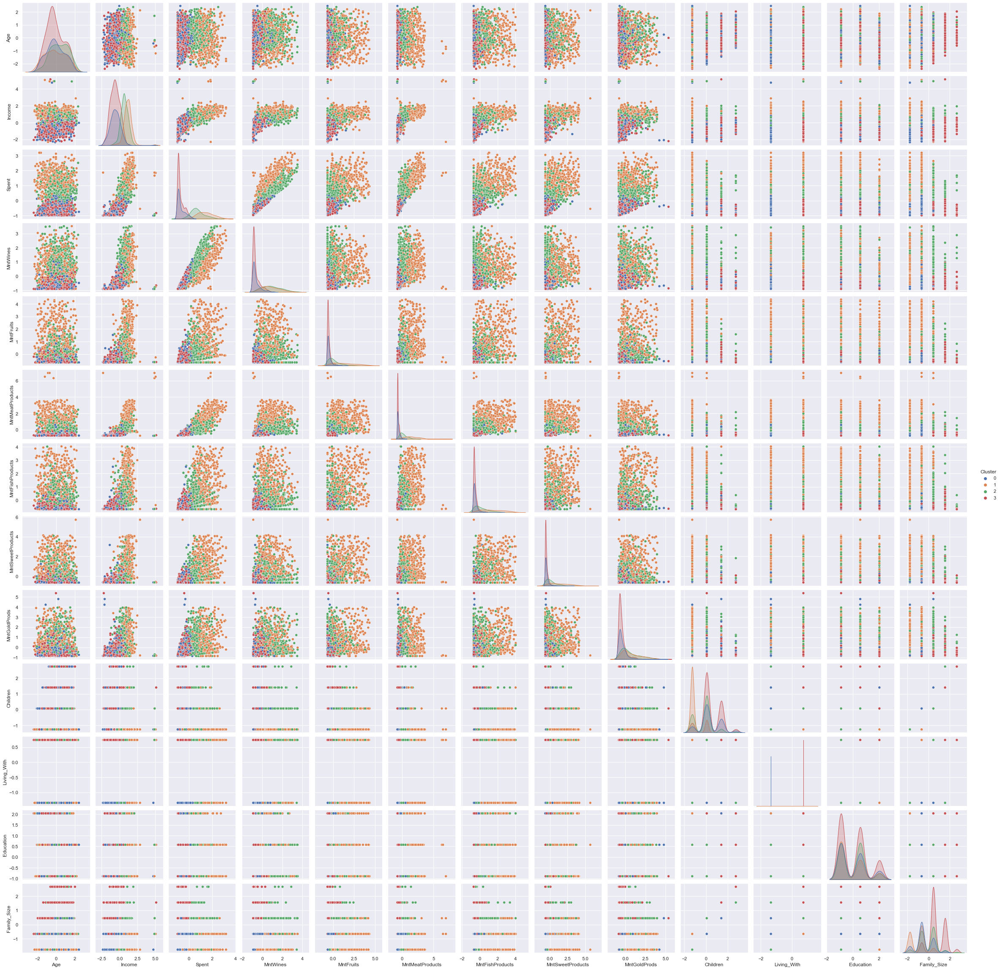

In [64]:
# Plot the Clusters on 2D grids
sb.pairplot(X_labeled_KM, hue = "Cluster")

<AxesSubplot:xlabel='Family_Size', ylabel='Cluster'>

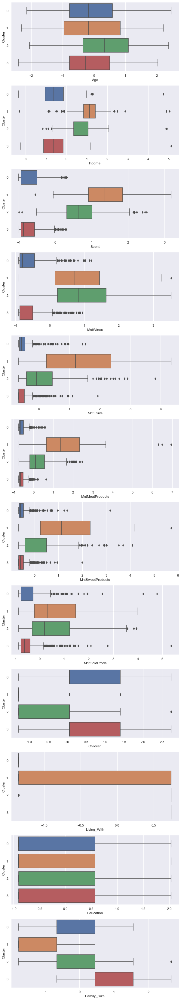

In [65]:
# Boxplots for all Features against the Clusters
f, axes = plt.subplots(12, 1, figsize=(10,60))
sb.boxplot(x = "Age", y = 'Cluster', data = X_labeled_KM, ax = axes[0])
sb.boxplot(x = "Income", y = 'Cluster', data = X_labeled_KM, ax = axes[1])
sb.boxplot(x = "Spent", y = 'Cluster', data = X_labeled_KM, ax = axes[2])
sb.boxplot(x = "MntWines", y = 'Cluster', data = X_labeled_KM, ax = axes[3])
sb.boxplot(x = "MntFruits", y = 'Cluster', data = X_labeled_KM, ax = axes[4])
sb.boxplot(x = "MntMeatProducts", y = 'Cluster', data = X_labeled_KM, ax = axes[5])
sb.boxplot(x = "MntSweetProducts", y = 'Cluster', data = X_labeled_KM, ax = axes[6])
sb.boxplot(x = "MntGoldProds", y = 'Cluster', data = X_labeled_KM, ax = axes[7])
sb.boxplot(x = "Children", y = 'Cluster', data = X_labeled_KM, ax = axes[8])
sb.boxplot(x = "Living_With", y = 'Cluster', data = X_labeled_KM, ax = axes[9])
sb.boxplot(x = "Education", y = 'Cluster', data = X_labeled_KM, ax = axes[10])
sb.boxplot(x = "Family_Size", y = 'Cluster', data = X_labeled_KM, ax = axes[11])

<AxesSubplot:xlabel='Cluster'>

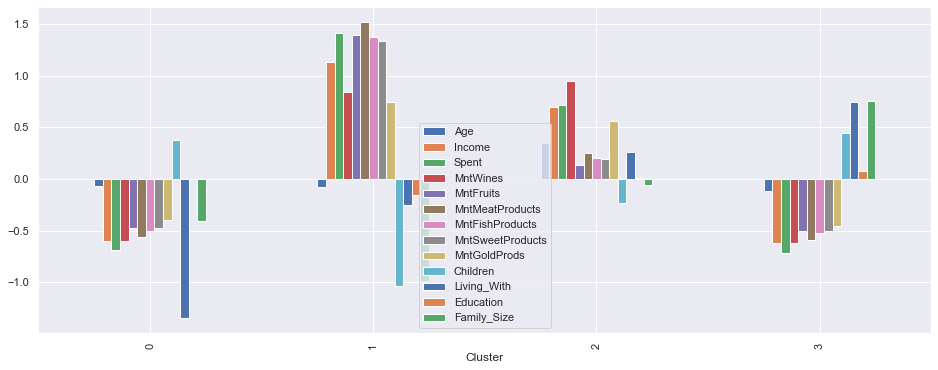

In [66]:
# Average Behaviour of each Cluster
cluster_data = pd.DataFrame(X_labeled_KM.groupby(by = "Cluster").mean())
cluster_data.plot.bar(figsize = (16,6))

In [67]:
# Evaluate the effectiveness
from sklearn.metrics import silhouette_score as S_score
#S_score(scaled_features_df, result, metric='euclidean', sample_size=None, random_state=None)

In [68]:
S_score(X_labeled_KM, labels, metric='euclidean', sample_size=None, random_state=None)

0.2756788257085452

## 2. Mini Patch K Means | DBSCAN (Tian Shulin)

In [69]:
scaled_features_df

,Age,Income,Spent,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Children,Living_With,Education,Family_Size
0,0.927582,0.287105,1.676245,0.977660,1.552041,1.690293,2.453472,1.483713,0.852576,-1.264598,-1.349603,-0.893586,-1.758359
1,1.353640,-0.260882,-0.963297,-0.872618,-0.637461,-0.718230,-0.651004,-0.634019,-0.733642,1.404572,-1.349603,-0.893586,0.449070
2,0.331100,0.913196,0.280110,0.357935,0.570540,-0.178542,1.339513,-0.147184,-0.037254,-1.264598,0.740959,-0.893586,-0.654644
3,-1.202709,-1.176114,-0.920135,-0.872618,-0.561961,-0.655787,-0.504911,-0.585335,-0.752987,0.069987,0.740959,-0.893586,0.449070
4,-0.947074,0.294307,-0.307562,-0.392257,0.419540,-0.218684,0.152508,-0.001133,-0.559545,0.069987,0.740959,0.571657,0.449070
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,0.160677,0.430444,1.218061,1.197084,0.419540,0.066770,0.079461,2.213965,3.928291,0.069987,0.740959,-0.893586,0.449070
2208,2.035334,0.560123,-0.271040,0.298631,-0.662628,-0.611184,-0.687527,-0.658360,-0.694954,2.739158,0.740959,0.571657,2.656499
2209,-0.947074,0.233347,1.052052,1.787156,0.545373,0.222878,-0.103155,-0.366260,-0.385448,-1.264598,-1.349603,-0.893586,-1.758359
2210,1.183217,0.803172,0.391336,0.363866,0.092373,0.209498,0.773403,0.071892,0.330284,0.069987,0.740959,0.571657,0.449070


In [70]:
#Creating a copy of data
ds = custdata.copy()

#Get list of categorical variables
s = (ds.dtypes == 'object')
object_cols = list(s[s].index)

print("Categorical variables in the dataset:", object_cols)

Categorical variables in the dataset: ['Education', 'Living_With']


In [71]:
#Label Encoding the object dtypes.
LE = LabelEncoder()
for i in object_cols:
    ds[i]=ds[[i]].apply(LE.fit_transform)
    
print("All features are now numerical")

All features are now numerical


### Dimensionality reduction using PCA

In [72]:
#Initiating PCA to reduce dimentions aka features to 3
pca = PCA(n_components=3)
pca.fit(scaled_features_df)
PCA_df = pd.DataFrame(pca.transform(scaled_features_df), columns=(["Education","Income", "Children",]))
#PCA_ds = pd.DataFrame(pca.transform(scaled_ds), columns=(["Education","Income", "Children","Family_Size"]))
PCA_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Education,2212.0,-2.770538e-17,2.351968,-3.600960,-1.956175,-0.764372,1.832943,6.891885
Income,2212.0,-7.930164e-18,1.281205,-3.685135,-0.851604,-0.007831,1.015544,4.590051
Children,2212.0,-2.012656e-17,1.049635,-2.820604,-0.734589,0.013035,0.748481,3.151965


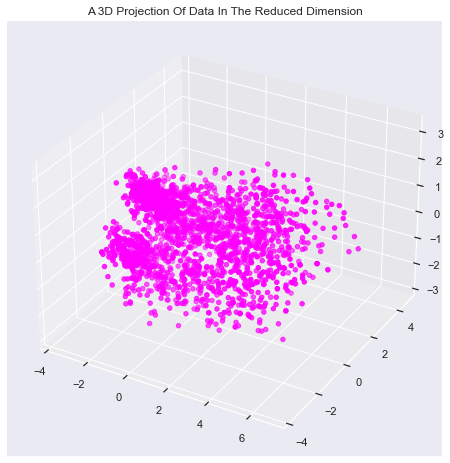

In [73]:
#A 3D Projection Of Data In The Reduced Dimension
x =PCA_df["Education"]
y =PCA_df["Income"]
z =PCA_df["Children"]

#To plot
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="magenta", marker="o" )
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

In [74]:
scaled_features_df

,Age,Income,Spent,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Children,Living_With,Education,Family_Size
0,0.927582,0.287105,1.676245,0.977660,1.552041,1.690293,2.453472,1.483713,0.852576,-1.264598,-1.349603,-0.893586,-1.758359
1,1.353640,-0.260882,-0.963297,-0.872618,-0.637461,-0.718230,-0.651004,-0.634019,-0.733642,1.404572,-1.349603,-0.893586,0.449070
2,0.331100,0.913196,0.280110,0.357935,0.570540,-0.178542,1.339513,-0.147184,-0.037254,-1.264598,0.740959,-0.893586,-0.654644
3,-1.202709,-1.176114,-0.920135,-0.872618,-0.561961,-0.655787,-0.504911,-0.585335,-0.752987,0.069987,0.740959,-0.893586,0.449070
4,-0.947074,0.294307,-0.307562,-0.392257,0.419540,-0.218684,0.152508,-0.001133,-0.559545,0.069987,0.740959,0.571657,0.449070
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,0.160677,0.430444,1.218061,1.197084,0.419540,0.066770,0.079461,2.213965,3.928291,0.069987,0.740959,-0.893586,0.449070
2208,2.035334,0.560123,-0.271040,0.298631,-0.662628,-0.611184,-0.687527,-0.658360,-0.694954,2.739158,0.740959,0.571657,2.656499
2209,-0.947074,0.233347,1.052052,1.787156,0.545373,0.222878,-0.103155,-0.366260,-0.385448,-1.264598,-1.349603,-0.893586,-1.758359
2210,1.183217,0.803172,0.391336,0.363866,0.092373,0.209498,0.773403,0.071892,0.330284,0.069987,0.740959,0.571657,0.449070


### MiniBatchKMeans

In [75]:
X

,Age,Income,Spent,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Children,Living_With,Education,Family_Size
0,0.927582,0.287105,1.676245,0.977660,1.552041,1.690293,2.453472,1.483713,0.852576,-1.264598,-1.349603,-0.893586,-1.758359
1,1.353640,-0.260882,-0.963297,-0.872618,-0.637461,-0.718230,-0.651004,-0.634019,-0.733642,1.404572,-1.349603,-0.893586,0.449070
2,0.331100,0.913196,0.280110,0.357935,0.570540,-0.178542,1.339513,-0.147184,-0.037254,-1.264598,0.740959,-0.893586,-0.654644
3,-1.202709,-1.176114,-0.920135,-0.872618,-0.561961,-0.655787,-0.504911,-0.585335,-0.752987,0.069987,0.740959,-0.893586,0.449070
4,-0.947074,0.294307,-0.307562,-0.392257,0.419540,-0.218684,0.152508,-0.001133,-0.559545,0.069987,0.740959,0.571657,0.449070
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,0.160677,0.430444,1.218061,1.197084,0.419540,0.066770,0.079461,2.213965,3.928291,0.069987,0.740959,-0.893586,0.449070
2208,2.035334,0.560123,-0.271040,0.298631,-0.662628,-0.611184,-0.687527,-0.658360,-0.694954,2.739158,0.740959,0.571657,2.656499
2209,-0.947074,0.233347,1.052052,1.787156,0.545373,0.222878,-0.103155,-0.366260,-0.385448,-1.264598,-1.349603,-0.893586,-1.758359
2210,1.183217,0.803172,0.391336,0.363866,0.092373,0.209498,0.773403,0.071892,0.330284,0.069987,0.740959,0.571657,0.449070


Text(0.5, 1.0, 'Distribution Of The Clusters')

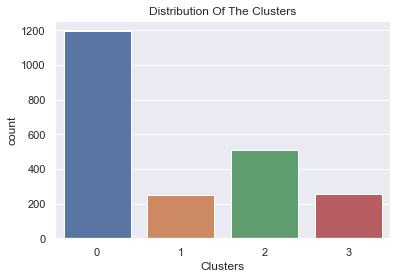

In [76]:
from sklearn.cluster import MiniBatchKMeans
#Initiating the MiniBatchKMeans Clustering model 
MBK = MiniBatchKMeans(n_clusters=4)

# fit model and predict clusters
MBK_labels = MBK.fit_predict(X)

#Adding the Clusters feature to the orignal dataframe.
X_labeled_MBK = X.copy()
X_labeled_MBK["Clusters"]= pd.Categorical(MBK_labels)

# Summary of the Cluster Labels
pl = sb.countplot(x=X_labeled_MBK["Clusters"])
pl.set_title("Distribution Of The Clusters")

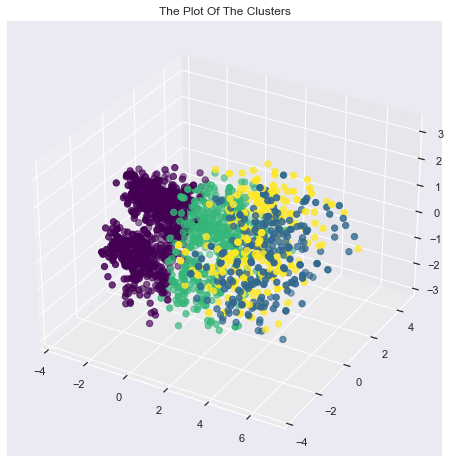

In [77]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=X_labeled_MBK["Clusters"], marker='o', cmap = 'viridis' )
ax.set_title("The Plot Of The Clusters")
plt.show()

In [78]:
X_labeled_MBK

,Age,Income,Spent,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Children,Living_With,Education,Family_Size,Clusters
0,0.927582,0.287105,1.676245,0.977660,1.552041,1.690293,2.453472,1.483713,0.852576,-1.264598,-1.349603,-0.893586,-1.758359,3
1,1.353640,-0.260882,-0.963297,-0.872618,-0.637461,-0.718230,-0.651004,-0.634019,-0.733642,1.404572,-1.349603,-0.893586,0.449070,0
2,0.331100,0.913196,0.280110,0.357935,0.570540,-0.178542,1.339513,-0.147184,-0.037254,-1.264598,0.740959,-0.893586,-0.654644,2
3,-1.202709,-1.176114,-0.920135,-0.872618,-0.561961,-0.655787,-0.504911,-0.585335,-0.752987,0.069987,0.740959,-0.893586,0.449070,0
4,-0.947074,0.294307,-0.307562,-0.392257,0.419540,-0.218684,0.152508,-0.001133,-0.559545,0.069987,0.740959,0.571657,0.449070,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,0.160677,0.430444,1.218061,1.197084,0.419540,0.066770,0.079461,2.213965,3.928291,0.069987,0.740959,-0.893586,0.449070,3
2208,2.035334,0.560123,-0.271040,0.298631,-0.662628,-0.611184,-0.687527,-0.658360,-0.694954,2.739158,0.740959,0.571657,2.656499,0
2209,-0.947074,0.233347,1.052052,1.787156,0.545373,0.222878,-0.103155,-0.366260,-0.385448,-1.264598,-1.349603,-0.893586,-1.758359,1
2210,1.183217,0.803172,0.391336,0.363866,0.092373,0.209498,0.773403,0.071892,0.330284,0.069987,0.740959,0.571657,0.449070,2


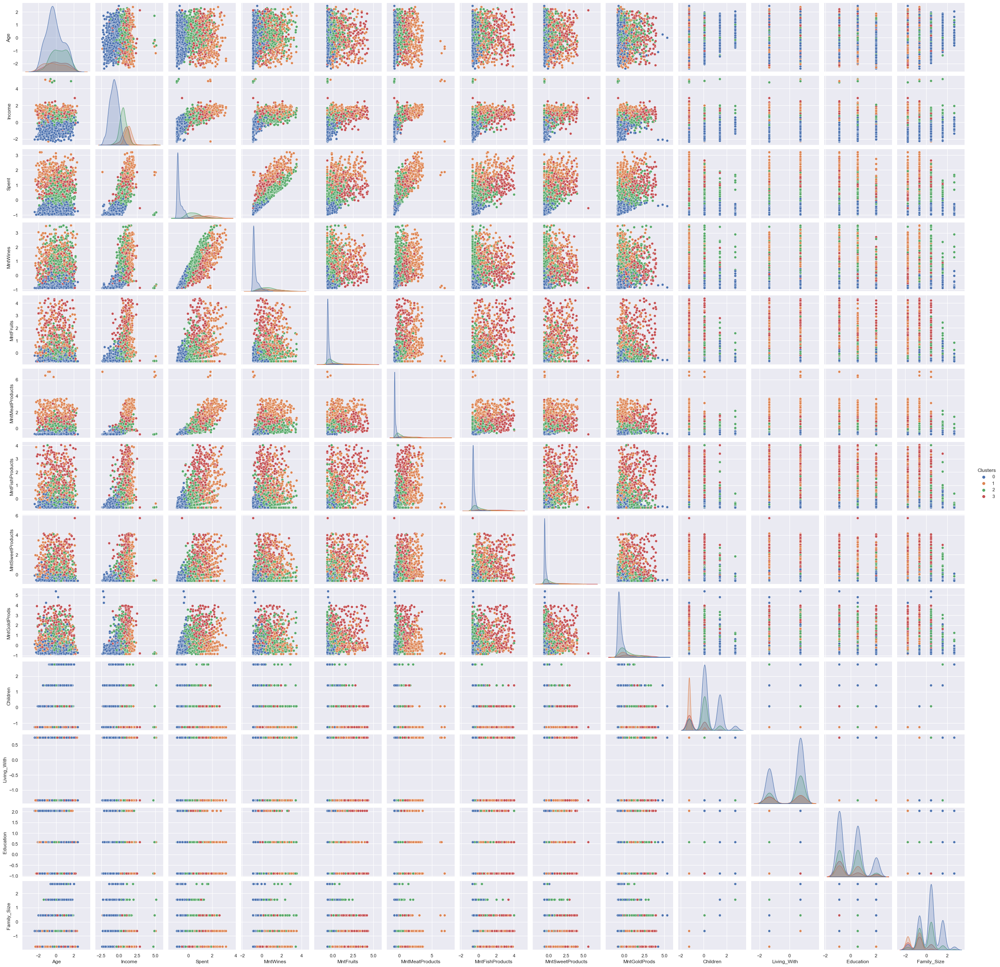

In [79]:
sb.pairplot(X_labeled_MBK, hue = "Clusters")

<AxesSubplot:xlabel='Clusters'>

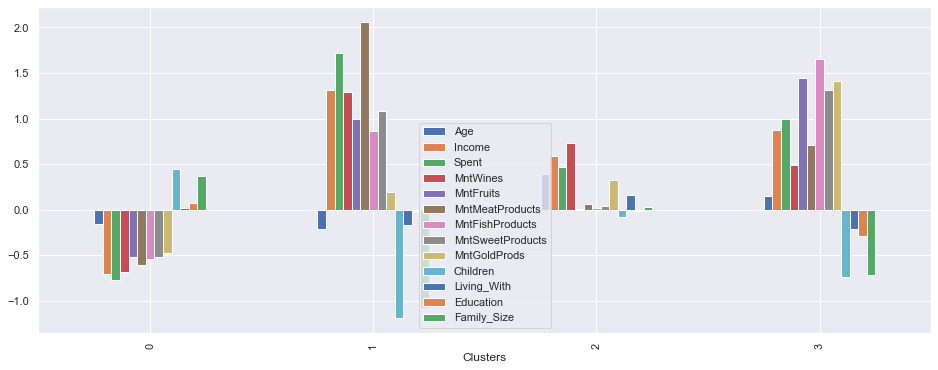

In [80]:
# Average Behaviour of each Cluster
cluster_data = pd.DataFrame(X_labeled_MBK.groupby(by = "Clusters").mean())
cluster_data.plot.bar(figsize = (16,6))

In [81]:
S_score(X_labeled_MBK, labels, metric='euclidean', sample_size=None, random_state=None)

0.17873316076121115

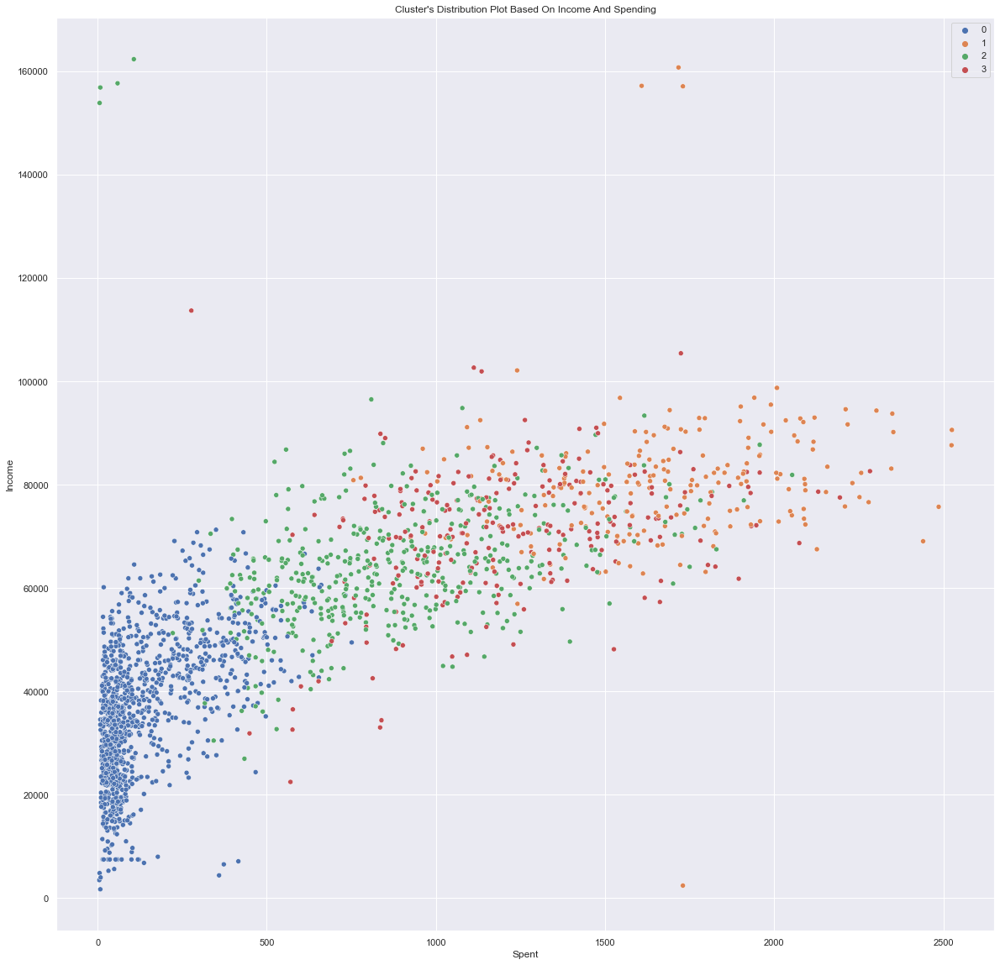

In [82]:
# Plot the Cluster's Distribution Plot
plt.figure(figsize=(20,20))
pl = sb.scatterplot(data =custdata ,x=custdata["Spent"], y=custdata["Income"],hue=X_labeled_MBK["Clusters"])
pl.set_title("Cluster's Distribution Plot Based On Income And Spending")
plt.legend()
plt.show()

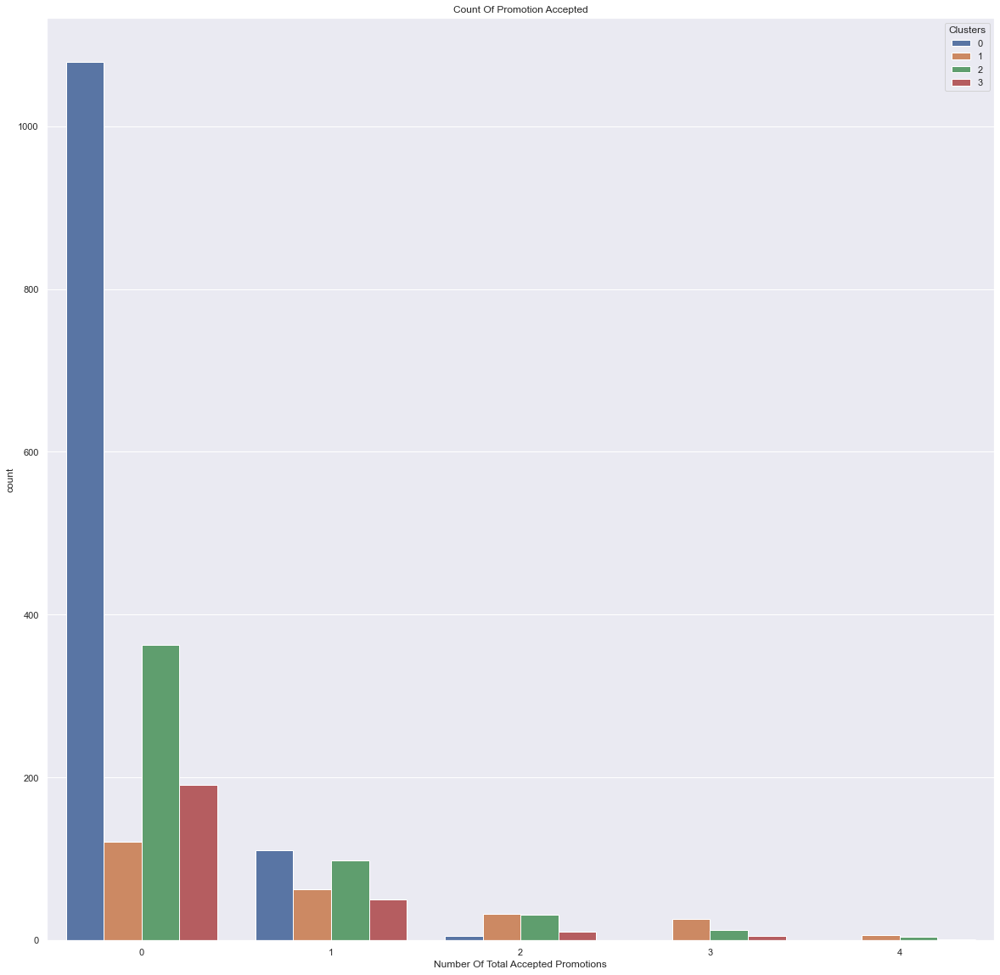

In [83]:
#Creating a feature to get a sum of accepted promotions 
custdata["Total_Promos"] = custdata["AcceptedCmp1"]+ custdata["AcceptedCmp2"]+ custdata["AcceptedCmp3"]+ custdata["AcceptedCmp4"]+ custdata["AcceptedCmp5"]
#Plotting count of total campaign accepted.
plt.figure(figsize=(20,20))
pl = sb.countplot(x=custdata["Total_Promos"],hue=X_labeled_MBK["Clusters"])
pl.set_title("Count Of Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()

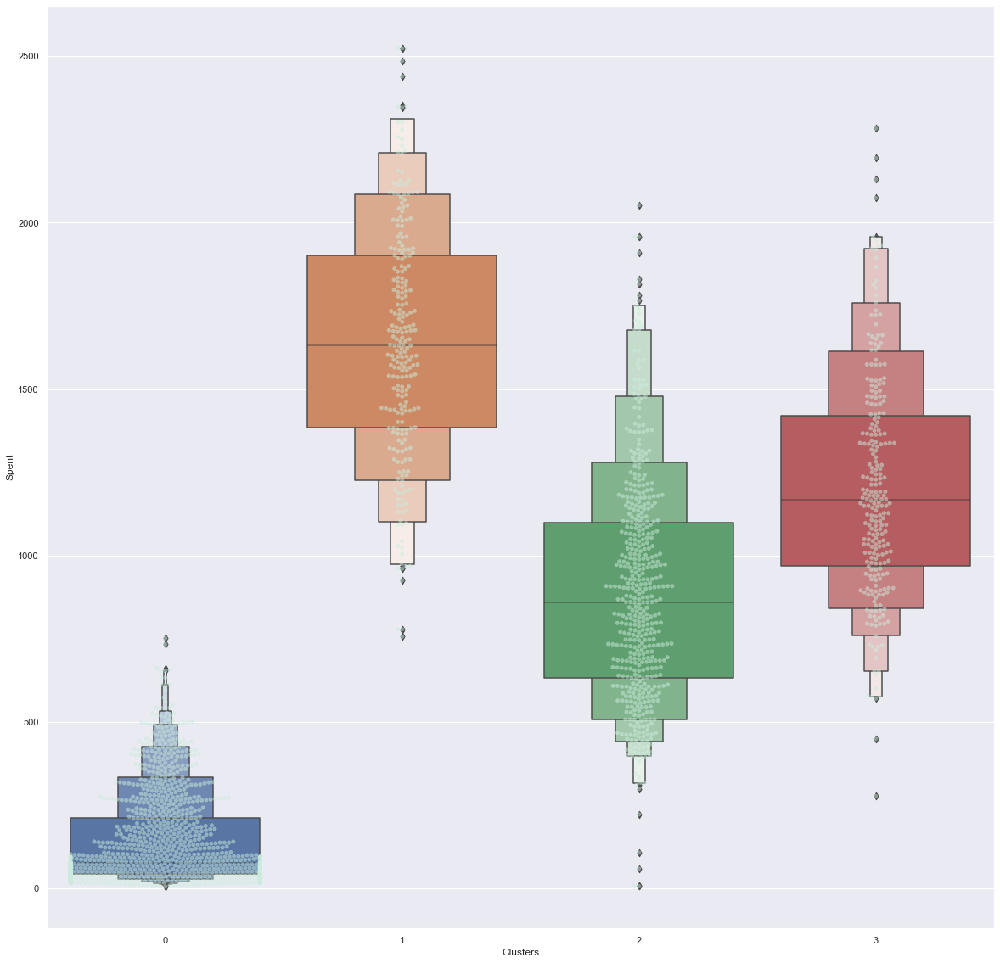

In [84]:
plt.figure(figsize=(20,20))
pl=sb.swarmplot(x=X_labeled_MBK["Clusters"], y=custdata["Spent"], color= "#CBEDDD", alpha=0.5 )
pl=sb.boxenplot(x=X_labeled_MBK["Clusters"], y=custdata["Spent"])
plt.show()

### Density-based spatial clustering of applications with noise (DBSCAN)

In [85]:
from sklearn.cluster import DBSCAN

#Initiating the DBSCAN Clustering model 
DP = DBSCAN(eps=0.3, min_samples= 22)

# fit model and predict clusters
DP_df = DP.fit_predict(PCA_df)
PCA_df["Clusters"] = pd.Categorical(DP_df)

#Adding the Clusters feature to the orignal dataframe.
X_labeled_DP = X.copy()
X_labeled_DP["Clusters"]= DP_df

In [86]:
X_labeled_DP["Clusters"]

0      -1
1      -1
2      -1
3       0
4      -1
       ..
2207   -1
2208   -1
2209   -1
2210   -1
2211   -1
Name: Clusters, Length: 2212, dtype: int64

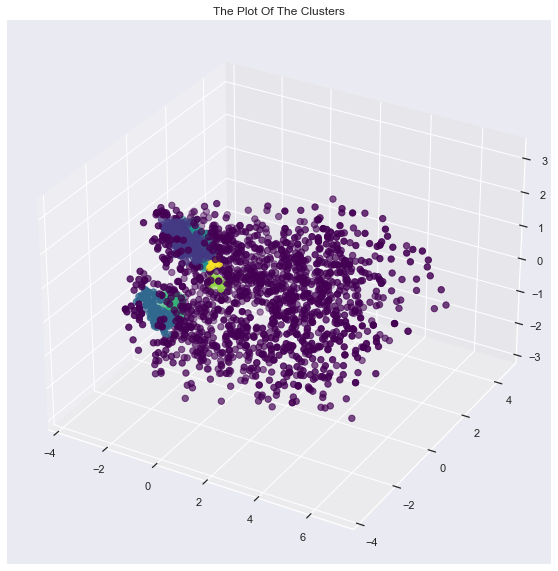

In [87]:
#Plotting the clusters
fig = plt.figure(figsize=(16,10))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=X_labeled_DP["Clusters"], marker='o', cmap = 'viridis' )
ax.set_title("The Plot Of The Clusters")
plt.show()

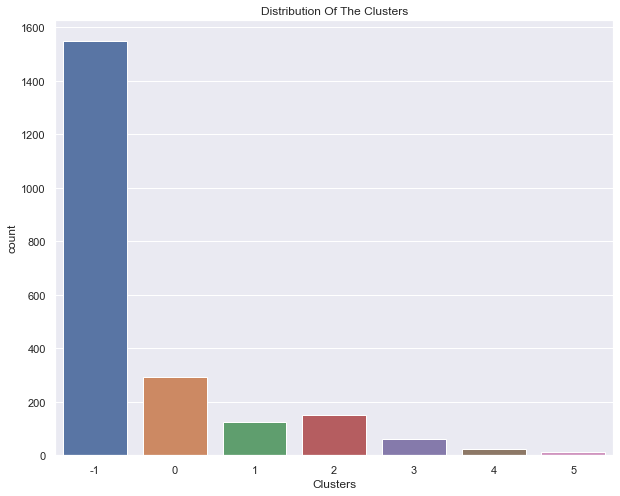

In [88]:
#Plotting countplot of clusters
plt.figure(figsize=(10,8))
pl = sb.countplot(x=X_labeled_DP["Clusters"])
pl.set_title("Distribution Of The Clusters")
plt.show()

<AxesSubplot:xlabel='Clusters'>

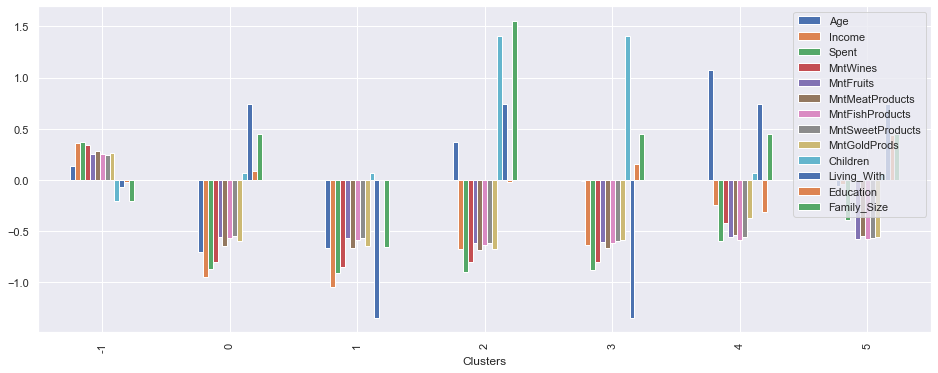

In [89]:
# Average Behaviour of each Cluster
cluster_data = pd.DataFrame(X_labeled_DP.groupby(by = "Clusters").mean())
cluster_data.plot.bar(figsize = (16,6))

In [90]:
S_score(X_labeled_DP, labels, metric='euclidean', sample_size=None, random_state=None)

0.15468170100107276

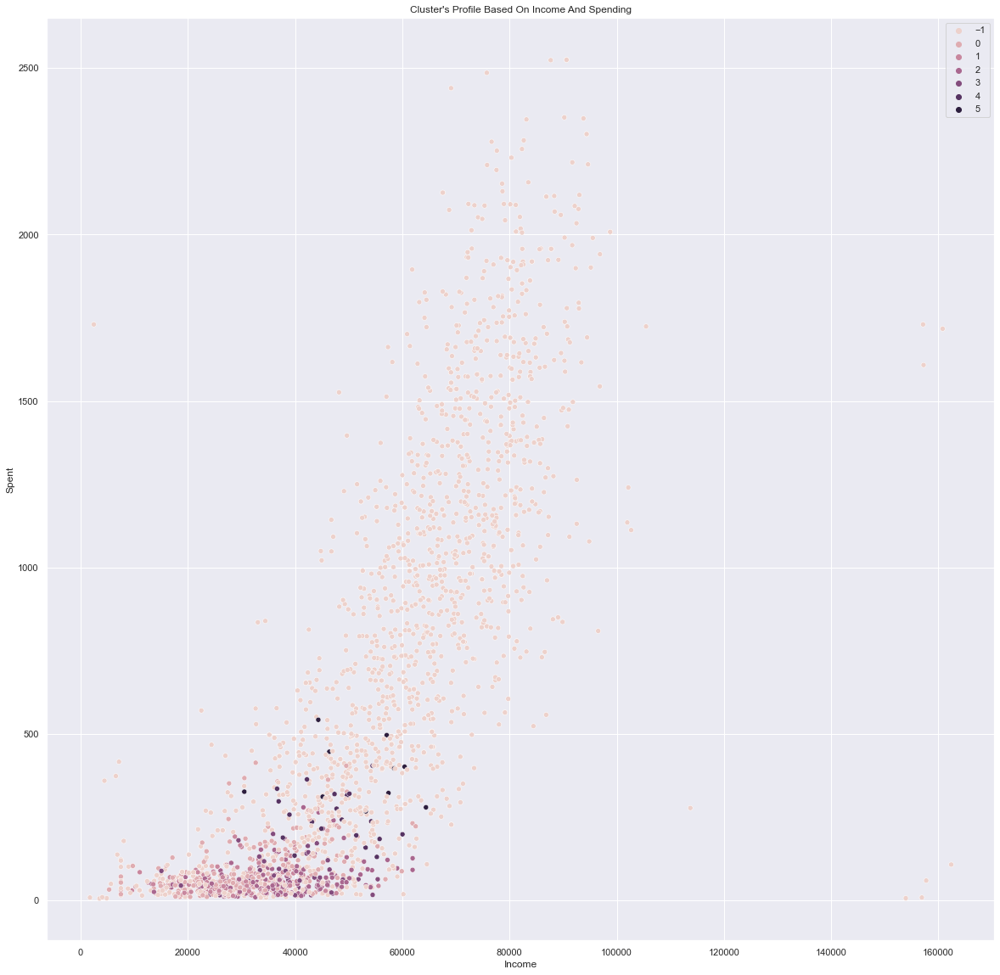

In [91]:
# Scatterplot of the income and spent distribution using DBSCAN
plt.figure(figsize=(20,20))
pl = sb.scatterplot(data = custdata,x=custdata["Income"], y=custdata["Spent"],hue=X_labeled_DP["Clusters"])
pl.set_title("Cluster's Profile Based On Income And Spending")
plt.legend()
plt.show()

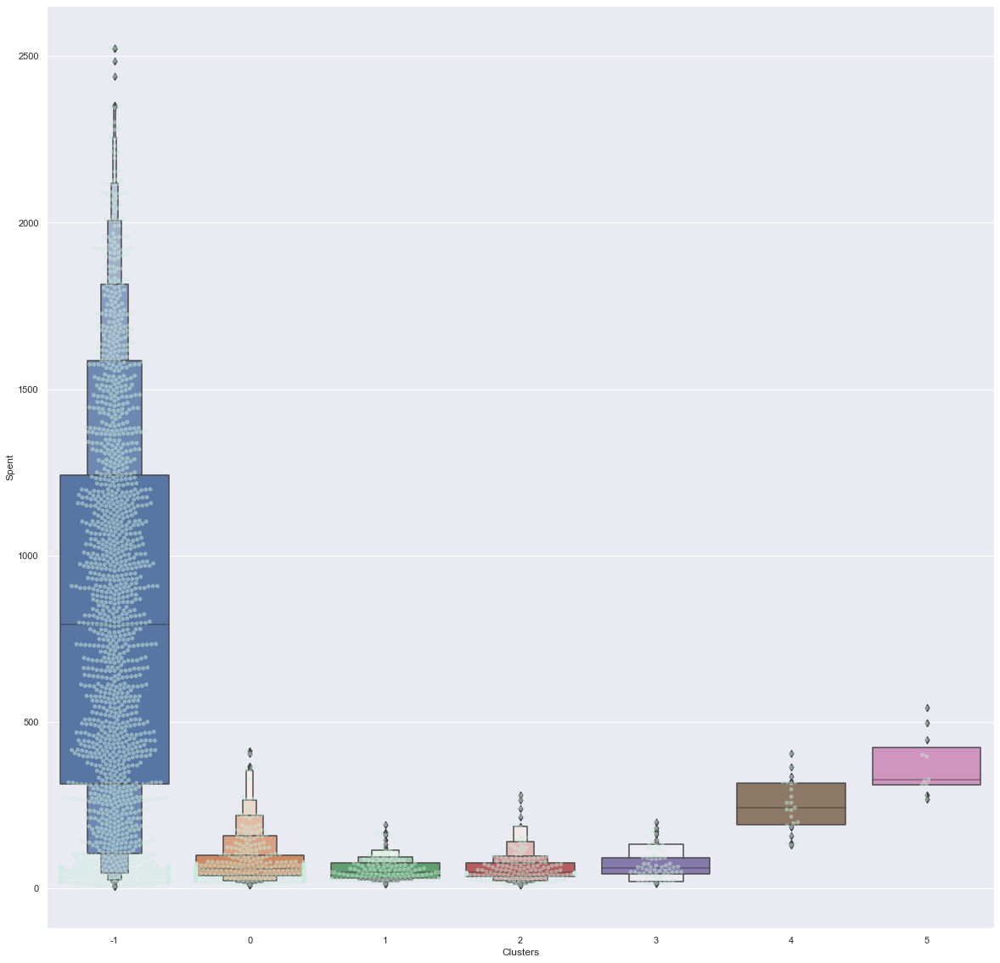

In [92]:
# Plot the cluster distribution using swarmplot and boxenplot
plt.figure(figsize=(20,20))
pl=sb.swarmplot(x=X_labeled_DP["Clusters"], y=custdata["Spent"], color= "#CBEDDD", alpha=0.5 )
pl=sb.boxenplot(x=X_labeled_DP["Clusters"], y=custdata["Spent"])
plt.show()

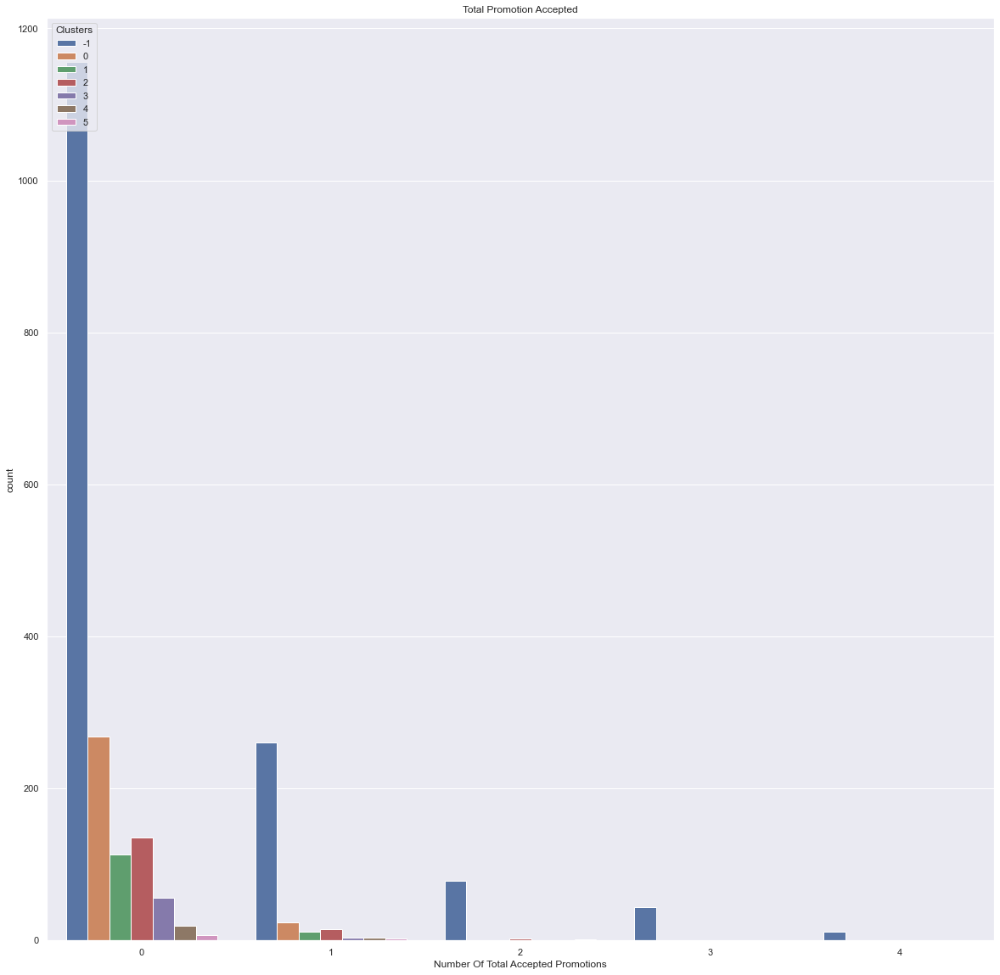

In [93]:
#Plotting count of total campaign accepted
plt.figure(figsize=(20,20))
pl = sb.countplot(x=custdata["Total_Promos"],hue=X_labeled_DP["Clusters"])
pl.set_title("Total Promotion Accepted")
pl.set_xlabel("Number Of Total Accepted Promotions")
plt.show()

## 3. BIRCH (Wang Yaoxuan)

In [94]:
custdata.head()

,Education,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,AcceptedCmp2,Complain,Response,Age,Spent,Living_With,Children,Family_Size,Is_Parent,Total_Promos
0,Graduate,58138.0,0,0,58,635,88,546,172,88,...,0,0,1,55,1617,Alone,0,1,0,0
1,Graduate,46344.0,1,1,38,11,1,6,2,1,...,0,0,0,60,27,Alone,2,3,1,0
2,Graduate,71613.0,0,0,26,426,49,127,111,21,...,0,0,0,48,776,Partner,0,2,0,0
3,Graduate,26646.0,1,0,26,11,4,20,10,3,...,0,0,0,30,53,Partner,1,3,1,0
4,Postgraduate,58293.0,1,0,94,173,43,118,46,27,...,0,0,0,33,422,Partner,1,3,1,0


<AxesSubplot:xlabel='Cluster', ylabel='count'>

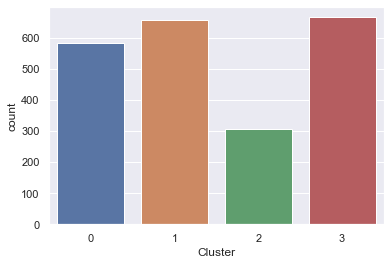

In [95]:
#Clustering using BIRCH
from sklearn.cluster import Birch
brc = Birch(n_clusters=4)
brc.fit(scaled_features_df)
result = brc.predict(scaled_features_df)
#Append label
scaled_features_labeled = scaled_features_df.copy()
scaled_features_labeled["Cluster"] = pd.Categorical(result)
#Countplot for clusters
sb.countplot(x=scaled_features_labeled["Cluster"])

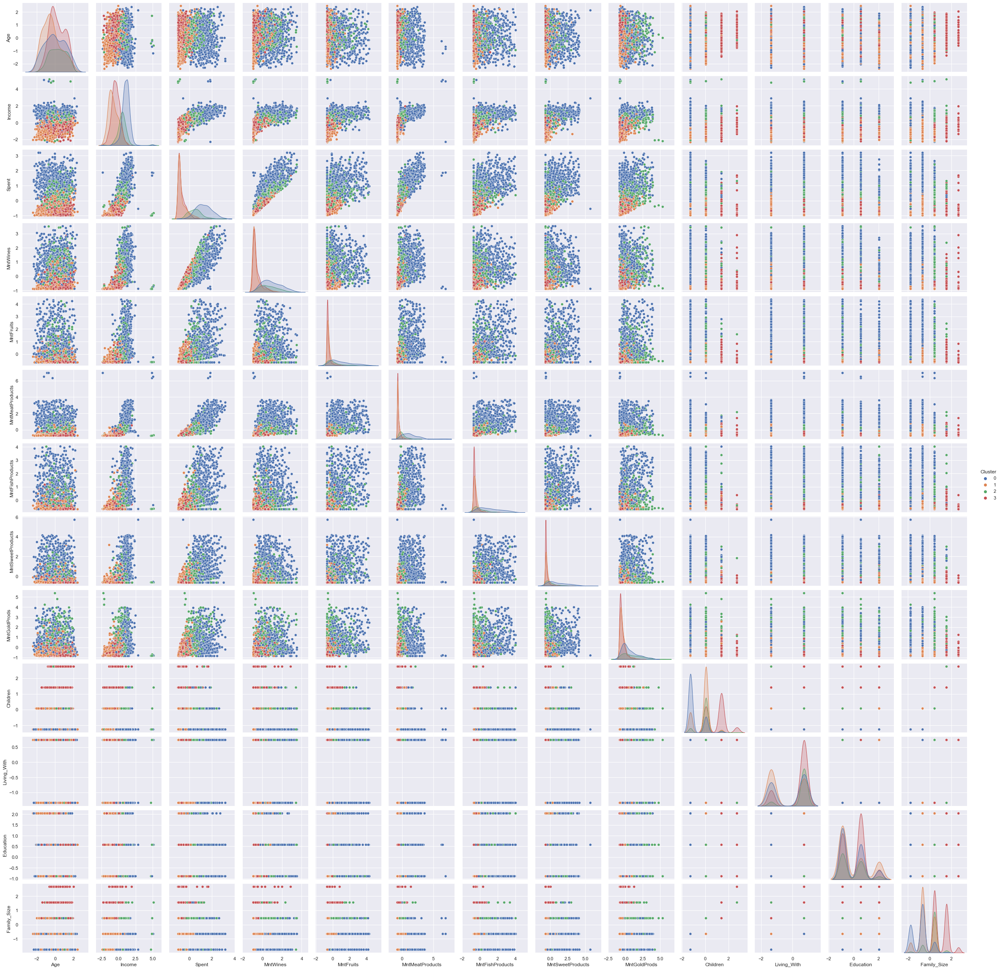

In [96]:
sb.pairplot(scaled_features_labeled, vars = scaled_features_df.columns.values, hue = "Cluster")

<AxesSubplot:xlabel='Cluster'>

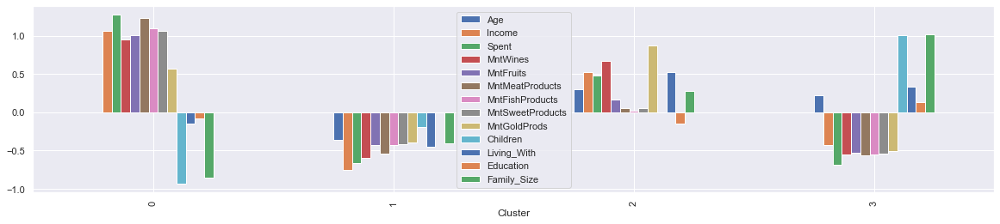

In [97]:
# Average Behaviour of each Cluster
cluster_data = pd.DataFrame(scaled_features_labeled.groupby(by = "Cluster").mean())
cluster_data.plot.bar(figsize = (20,4))

In [98]:
S_score(scaled_features_df, result, metric='euclidean', sample_size=None, random_state=None)

0.11816302751383677

# Cluster Analysis

## 1) Cluster Interpretation (Tian Shulin)

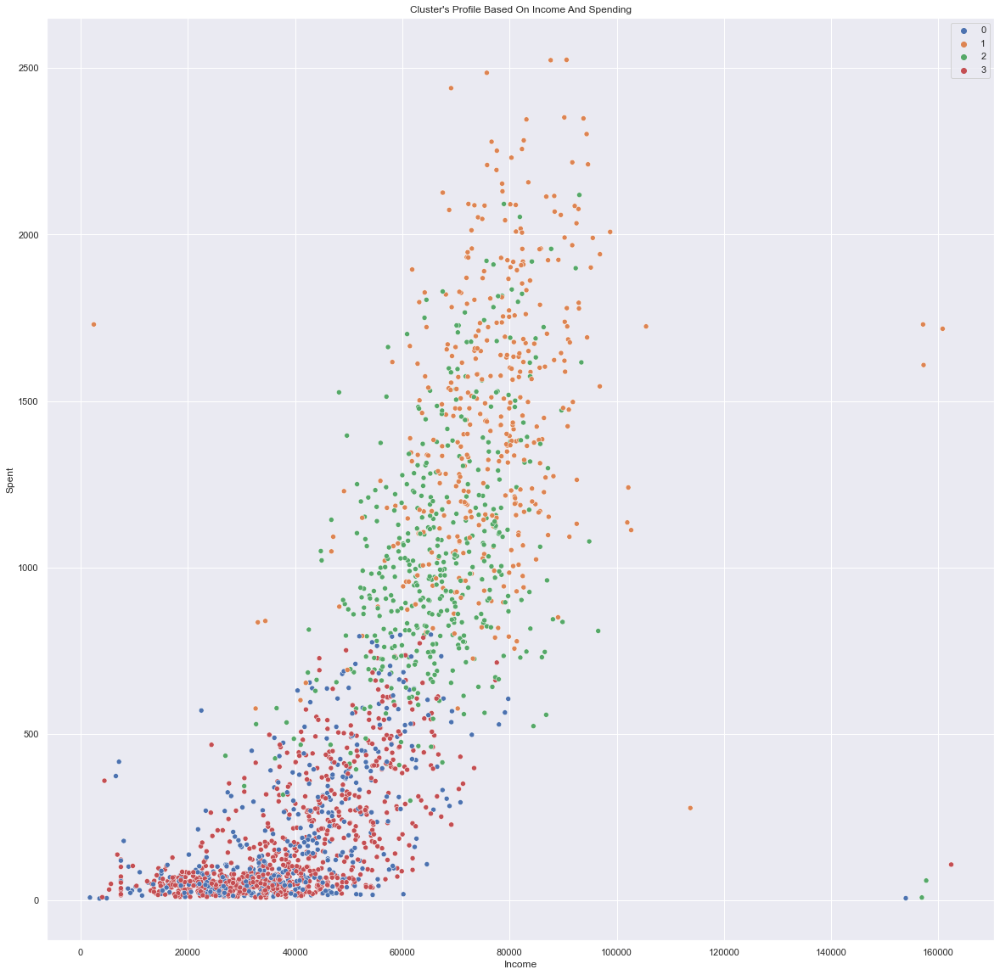

In [99]:
# Scatterplot of the income and spent distribution using K-Means
plt.figure(figsize=(20,20))
pl = sb.scatterplot(data = custdata,x=custdata["Income"], y=custdata["Spent"],hue=X_labeled_KM["Cluster"])
pl.set_title("Cluster's Profile Based On Income And Spending")
plt.legend()
plt.show()

In [100]:
X_labeled_KM

,Age,Income,Spent,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Children,Living_With,Education,Family_Size,Cluster
0,0.927582,0.287105,1.676245,0.977660,1.552041,1.690293,2.453472,1.483713,0.852576,-1.264598,-1.349603,-0.893586,-1.758359,1
1,1.353640,-0.260882,-0.963297,-0.872618,-0.637461,-0.718230,-0.651004,-0.634019,-0.733642,1.404572,-1.349603,-0.893586,0.449070,0
2,0.331100,0.913196,0.280110,0.357935,0.570540,-0.178542,1.339513,-0.147184,-0.037254,-1.264598,0.740959,-0.893586,-0.654644,2
3,-1.202709,-1.176114,-0.920135,-0.872618,-0.561961,-0.655787,-0.504911,-0.585335,-0.752987,0.069987,0.740959,-0.893586,0.449070,3
4,-0.947074,0.294307,-0.307562,-0.392257,0.419540,-0.218684,0.152508,-0.001133,-0.559545,0.069987,0.740959,0.571657,0.449070,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,0.160677,0.430444,1.218061,1.197084,0.419540,0.066770,0.079461,2.213965,3.928291,0.069987,0.740959,-0.893586,0.449070,2
2208,2.035334,0.560123,-0.271040,0.298631,-0.662628,-0.611184,-0.687527,-0.658360,-0.694954,2.739158,0.740959,0.571657,2.656499,3
2209,-0.947074,0.233347,1.052052,1.787156,0.545373,0.222878,-0.103155,-0.366260,-0.385448,-1.264598,-1.349603,-0.893586,-1.758359,2
2210,1.183217,0.803172,0.391336,0.363866,0.092373,0.209498,0.773403,0.071892,0.330284,0.069987,0.740959,0.571657,0.449070,2


In [101]:
# Append the clustering lable to the original variables that were used for clustering
clusteringVarData_origin["Cluster"] = X_labeled_KM["Cluster"]

In [102]:
clusteringVarData_origin.groupby("Cluster")

In [103]:
clusteringVarData_origin

,Age,Income,Spent,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Children,Living_With,Education,Family_Size,Cluster
0,55,58138.0,1617,635,88,546,172,88,88,0,Alone,Graduate,1,1
1,60,46344.0,27,11,1,6,2,1,6,2,Alone,Graduate,3,0
2,48,71613.0,776,426,49,127,111,21,42,0,Partner,Graduate,2,2
3,30,26646.0,53,11,4,20,10,3,5,1,Partner,Graduate,3,3
4,33,58293.0,422,173,43,118,46,27,15,1,Partner,Postgraduate,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,46,61223.0,1341,709,43,182,42,118,247,1,Partner,Graduate,3,2
2208,68,64014.0,444,406,0,30,0,0,8,3,Partner,Postgraduate,5,3
2209,33,56981.0,1241,908,48,217,32,12,24,0,Alone,Graduate,1,2
2210,58,69245.0,843,428,30,214,80,30,61,1,Partner,Postgraduate,3,2


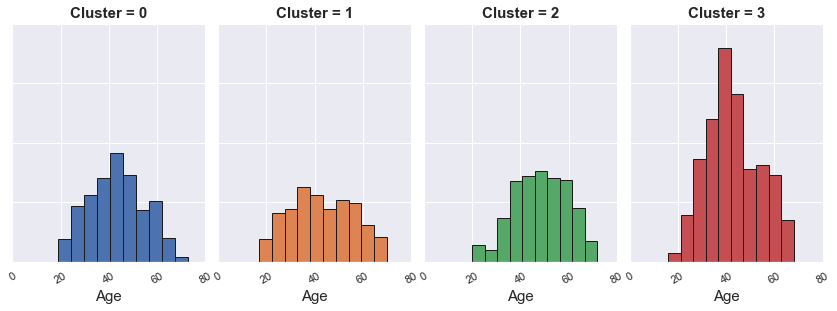

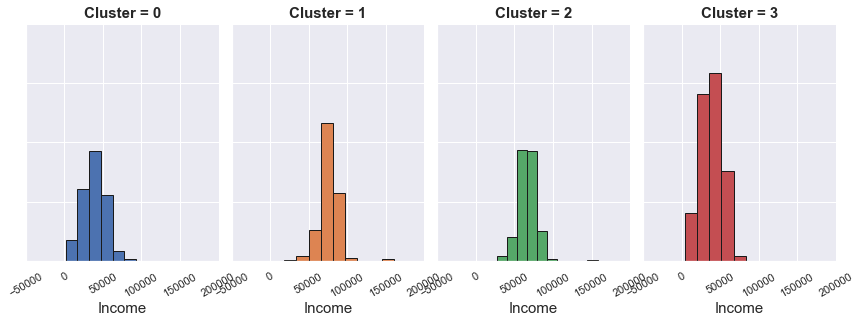

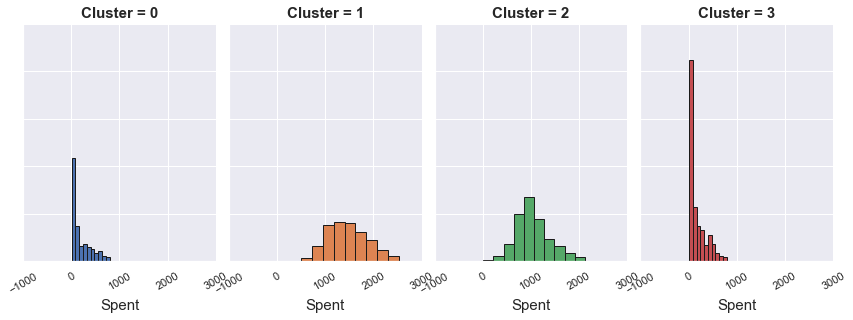

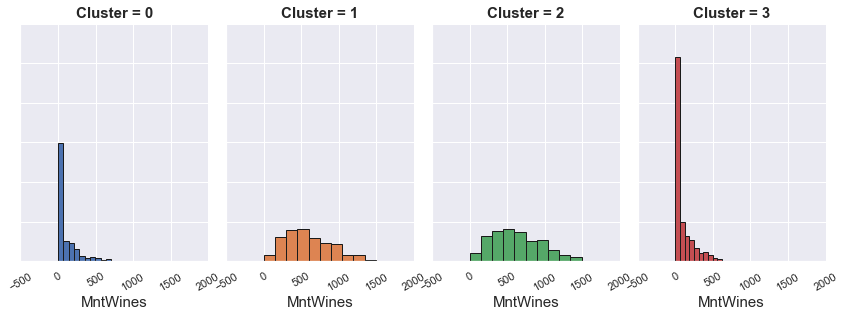

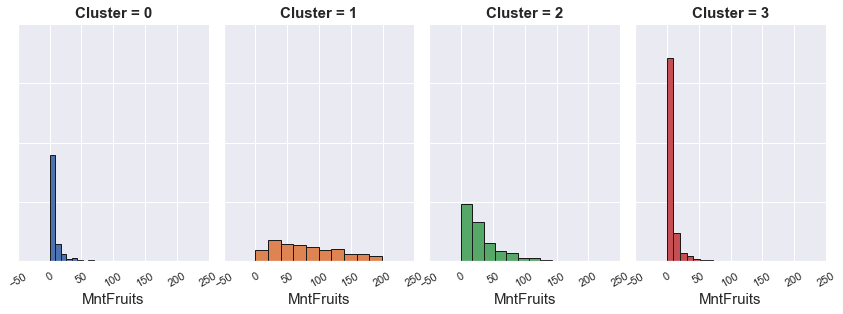

...

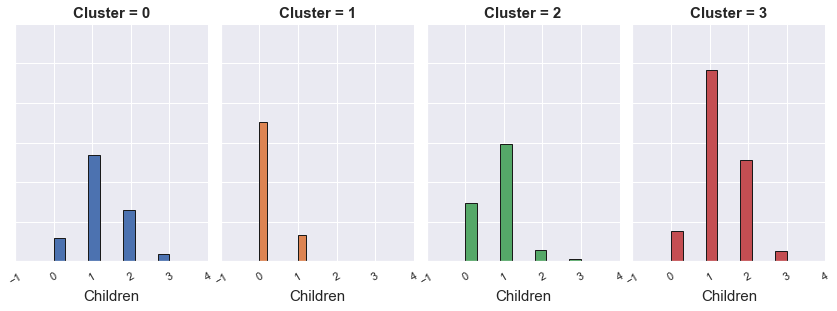

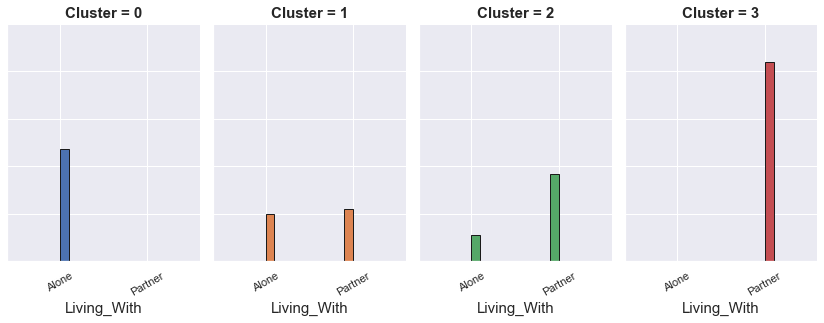

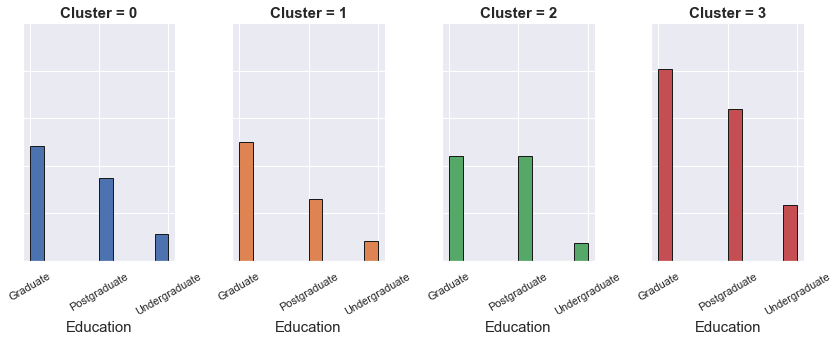

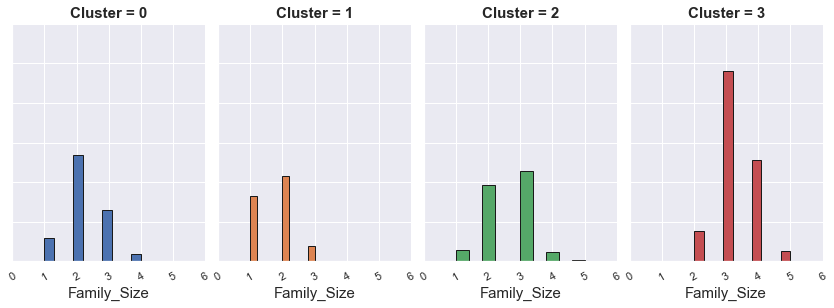

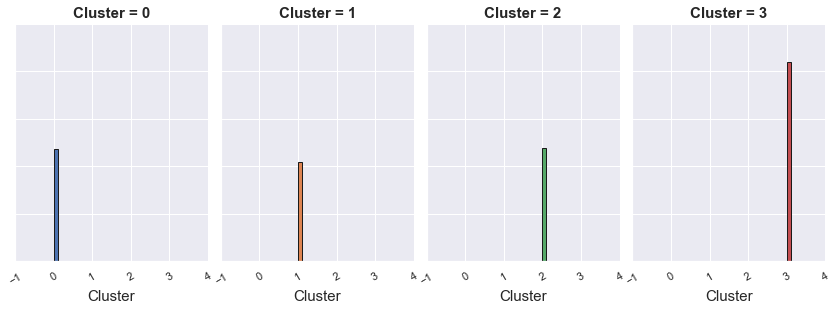

In [104]:
# FacetGrid
for i in clusteringVarData_origin:
    g = sb.FacetGrid(clusteringVarData_origin, col = "Cluster", hue = "Cluster")
    g.map(plt.hist, i, bins = 10, ec="k") 
    g.set_xticklabels(rotation=30)
    g.set_yticklabels()
    g.set_xlabels(size=15)
    g.set_titles(size=15, fontweight="bold")
    g.fig.set_figheight(5)

<AxesSubplot:xlabel='Family_Size', ylabel='Cluster'>

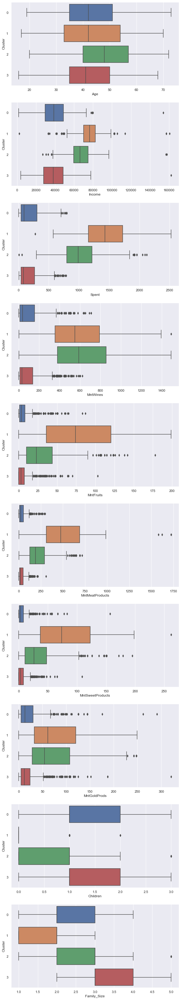

In [105]:
# Boxplots for all Numeric Features against the Clusters
# Copy the boxplots from K-Means++, and I revised it a little bit; credit to: Hou Bo
f, axes = plt.subplots(10, 1, figsize=(10,60))

sb.boxplot(x = "Age", y = 'Cluster', data = clusteringVarData_origin, ax = axes[0])
sb.boxplot(x = "Income", y = 'Cluster', data = clusteringVarData_origin, ax = axes[1])
sb.boxplot(x = "Spent", y = 'Cluster', data = clusteringVarData_origin, ax = axes[2])
sb.boxplot(x = "MntWines", y = 'Cluster', data = clusteringVarData_origin, ax = axes[3])
sb.boxplot(x = "MntFruits", y = 'Cluster', data = clusteringVarData_origin, ax = axes[4])
sb.boxplot(x = "MntMeatProducts", y = 'Cluster', data = clusteringVarData_origin, ax = axes[5])
sb.boxplot(x = "MntSweetProducts", y = 'Cluster', data = clusteringVarData_origin, ax = axes[6])
sb.boxplot(x = "MntGoldProds", y = 'Cluster', data = clusteringVarData_origin, ax = axes[7])
sb.boxplot(x = "Children", y = 'Cluster', data = clusteringVarData_origin, ax = axes[8])
sb.boxplot(x = "Family_Size", y = 'Cluster', data = clusteringVarData_origin, ax = axes[9])

## 2) Product Distribution (Hou Bo)

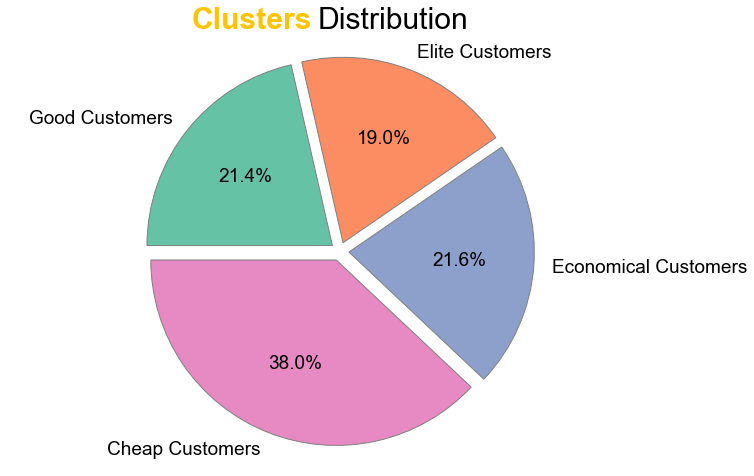

In [106]:
clusters_count = X_labeled_KM['Cluster'].value_counts()                        # Counting wins-losses-draws
clusters_count = clusters_count.to_frame().reset_index()                      # Convert series to dataframe
clusters_count.columns = ['clusters', 'count']                                # Rename column names
clusters_count = clusters_count.sort_values('clusters', ascending = True)     # Sorting data

labels = [
        "Good Customers", 
        "Elite Customers", 
        "Economical Customers", 
        "Cheap Customers"
        ]

# Visualization
plt.figure(figsize=(12,8))

mpl.rcParams['font.size'] = 17
colors = sb.color_palette('Set2')[0:4]

plt.pie(clusters_count['count'], 
        explode=(0.05, 0.05, 0.05, 0.05), 
        labels = labels,
        colors= colors,
        autopct='%1.1f%%',
        textprops = dict(color ="black", fontsize=19),
        counterclock = False,
        startangle=180,
        wedgeprops={"edgecolor":"gray",'linewidth': 1}
        )

plt.axis('equal')

# Title 
plt.text(-0.8, 1.2, "Clusters", size=30, color="#FFC300", fontweight="bold")
plt.text(-0.12, 1.2, "Distribution", size=30, color="black")

plt.show()

## 3) Product Distribution (WYX)

In [107]:
import plotly.express as px
# A new dataset for plotting
products_labeled = MntProduct_data.copy()
products_labeled['Cluster'] = X_labeled_KM["Cluster"]
products_by_clusters = products_labeled[["Cluster","MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds"]].groupby("Cluster")
productsSum_by_clusters = products_by_clusters.agg({'MntWines':'sum', 'MntFruits':'sum', 'MntMeatProducts':'sum', 'MntFishProducts':'sum', 'MntSweetProducts':'sum', 'MntGoldProds':'sum'})

productsSum_by_clusters_final = productsSum_by_clusters.stack().reset_index(name='Count').rename(columns={'level_1':'Products'})

# Rename values
productsSum_by_clusters_final['Cluster'] = productsSum_by_clusters_final['Cluster'].astype(str)
productsSum_by_clusters_final['Cluster'] = productsSum_by_clusters_final['Cluster'].str.replace('0', "Type One")
productsSum_by_clusters_final['Cluster'] = productsSum_by_clusters_final['Cluster'].str.replace('1', "Type Two")
productsSum_by_clusters_final['Cluster'] = productsSum_by_clusters_final['Cluster'].str.replace('2', "Type Three")
productsSum_by_clusters_final['Cluster'] = productsSum_by_clusters_final['Cluster'].str.replace('3', "Type Four")

productsRatio_by_clusters = productsSum_by_clusters_final.copy()
productsRatio_by_clusters = productsRatio_by_clusters.assign(ratio=productsRatio_by_clusters.groupby('Cluster').Count.transform(lambda x: x / x.sum()))

productsRatio_by_clusters

,Cluster,Products,Count,ratio
0,Type One,MntWines,48962,0.535930
1,Type One,MntFruits,3605,0.039460
2,Type One,MntMeatProducts,19505,0.213498
3,Type One,MntFishProducts,4807,0.052617
4,Type One,MntSweetProducts,3510,0.038420
5,Type One,MntGoldProds,10970,0.120076
6,Type Two,MntWines,247569,0.404928
7,Type Two,MntFruits,34227,0.055982
8,Type Two,MntMeatProducts,213278,0.348841
9,Type Two,MntFishProducts,47489,0.077674


In [108]:
fig = px.bar(productsRatio_by_clusters, x='Cluster', y='ratio', color='Products', title="Product Distribution")
fig.show()

---

# Conclusion (Hou Bo, Tian Shulin, Wang Yaoxuan)

## 1.  Conclusion from Analysis

> Income: Cluster 1 > Cluster 3 > Cluster 0 ≈ Cluster 2

>Spent: Cluster 1 > Cluster 3 > Cluster 0 > Cluster 2

We call cluster 1 **"Elite customers"**, they tend to have highest income, highest spending habits, living alone, smallest family size (live alone and tend to have no children).

We call cluster 3 **"Good customers"**, they tend to have high income, high spending habits, living with partner, medium family size (tend to have no children or 1 children).

We call cluster 0 **"Economical customers"**, they tend to have low income, low spending habits, living alone, medium family size (tend to have 1 children or 2 children).

We call cluster 2 **"Cheap customers"**, they tend to have low income, lowest spending habits, living with partner, biggest family size (tend to have children).

All customers tend to consume mainly on Wines and Meat, however, as the spending habites are different, the total consumption would also be different.

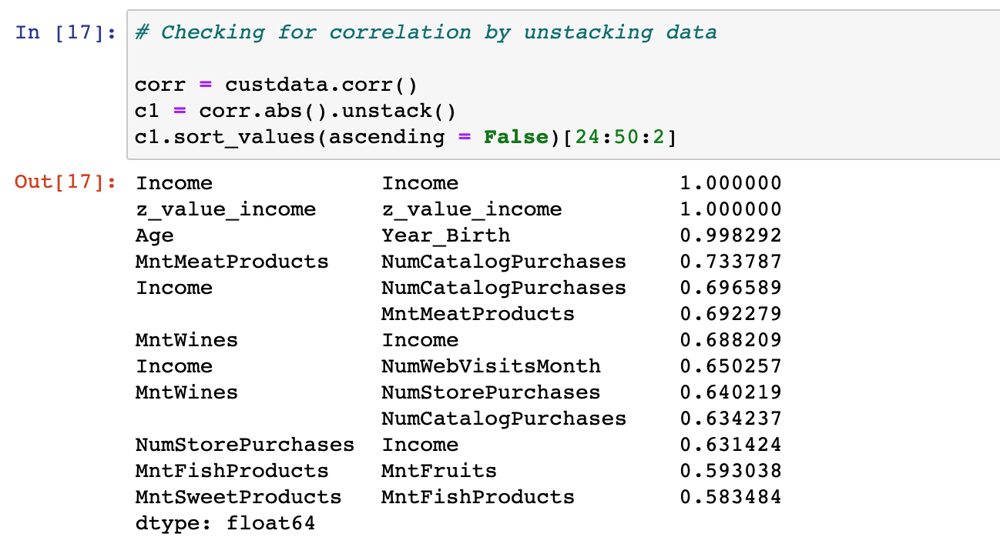

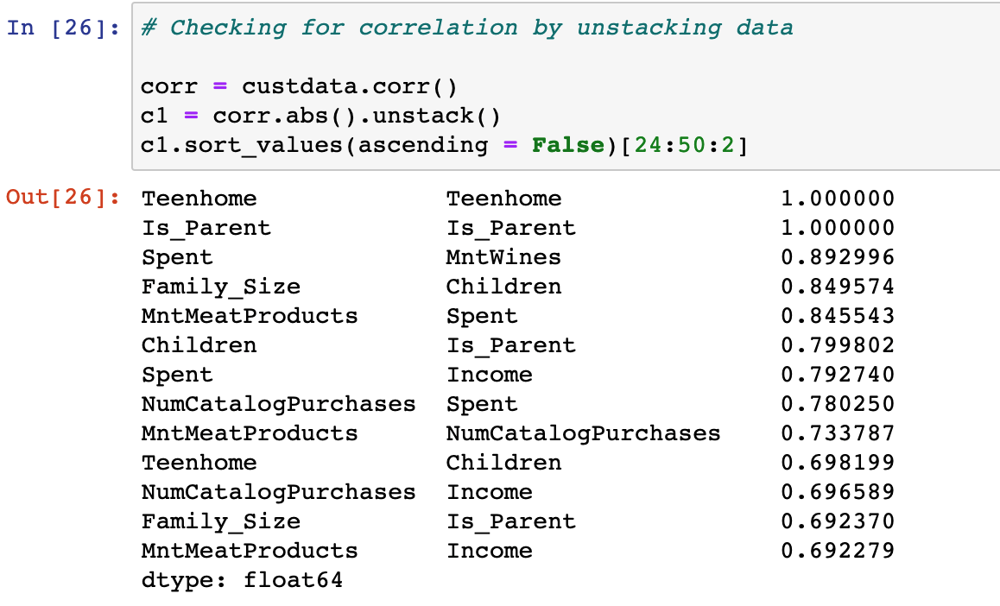

According to the correlation by unstacking data:

"Spent" has high correlation with "MntWines" and "MntMeatProducts", which proves the conclusion that all customers tend to spend more on wines.

"Spent" has high correlation with "Income", which also proves that higher income indicates higher spending habits and vise versa.

"MntFishProducts" got correlation with "MntFruits".

"MntFishProducts" got correlation with "MntSweetProducts".

**Fun Fact:** 

1. We thought customers who have bigger family size tend to consume more, i.e., “Spent” could have high correlation with "Family_size", however, after our data analytics, we found that customers who have higher income tend to spend more, i.e., "Spent" have high correlation with "Income"

2. Wines are the most popular products for customers

3. Customers with high income who live alone tend to have higher spending habits compared to those living with partner.


## 2. Business Suggestions

Now we have 4 customer segments. Company can use our analytics to modify their products and improve their business strategy.

For example:

1. To increase the overall profits, company can give more promotions and cast low-profits product advertisements to "Economical" and "Cheap" customers; provide high-quality with high-profit products to "Elite" and "Good" customers.

2. People tend to buy fish with fruits, so market manager can put them toghether in the market.

3. Company can predict a new membership's spending habir based on his/her basic information. Hence, company can adjust promotion methods and cast suitable promotions to new customers.

4. ...




